In [1]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.size'] = 13

import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten #, Reshape
from keras.layers import Conv1D, MaxPooling1D, GlobalMaxPooling1D, AveragePooling1D

2024-03-05 19:40:35.600331: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-05 19:40:35.632237: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-05 19:40:35.632275: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-05 19:40:35.633384: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-05 19:40:35.639539: I external/local_tsl/tsl/cuda/cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-05 19:40:35.640120: I tensorflow/core/platform/cpu_feature_guard.cc:1

### Read data

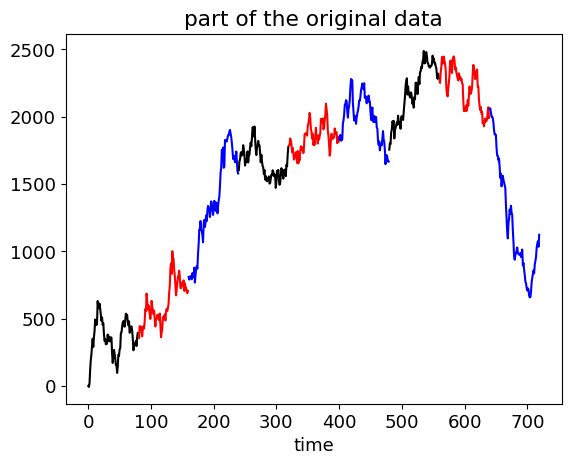

data:  4000


In [2]:
def Show_data(x,L,s="data",T=3):
    c=("k","r","b")
    for i in range(T):
        j=i*3*L
        plt.plot(np.arange(j,j+L),x[i*3],c=c[0])
        plt.plot(np.arange(j+L,j+2*L),x[i*3+1],c=c[1])
        plt.plot(np.arange(j+2*L,j+3*L),x[i*3+2],c=c[2])
    plt.title(s)
    plt.xlabel("time")
    plt.show()
    
str0="ts_L80_N4000.dat"
fnamex='x_'+str0
fnamey='y_'+str0

x = np.loadtxt(fnamex, delimiter=" ",dtype=float)
N,L = len(x), len(x[0])

Show_data(x,L,"part of the original data")

categ = np.loadtxt(fnamey, dtype=int)
n_class = 3    # y.argmax() - y.argmin() +1
print('data: ',N)

y = np.zeros((N,n_class))
for i in range(N):
    y[i][categ[i]] = 1.



### Rescale data, split train/val.

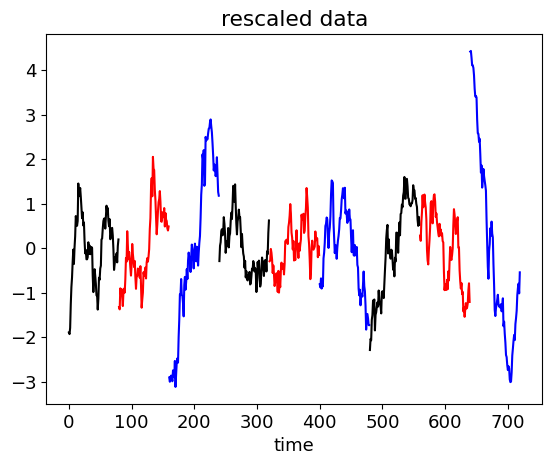

N_train= 3200   N_val= 800   L= 80   n_class= 3


In [3]:
#
#  FIRST PASSAGE:  DO NOT DO THIS --> FAILURE 
#
# bring each sample to zero average
xm = x.mean(axis=1)
for i in range(N):
    x[i] = x[i]-xm[i]

#
#  SECOND PASSAGE:  DO NOT DO THIS --> ALSO FAILURE 
#
#rescale (crude version, variance should be used)
x = x / x.std()
    
Show_data(x,L,"rescaled data")

perc_train=0.8
N_train = int(perc_train*N)
x_train = x[:N_train]
y_train = y[:N_train]
x_val = x[N_train:]
y_val = y[N_train:]
N_val = len(x_val)
print('N_train=',N_train,'  N_val=',N_val,'  L=',L,'  n_class=',n_class)

# Keras wants an additional dimension with a 1 at the end
x_train = x_train.reshape(x_train.shape[0], L, 1)
x_val =  x_val.reshape(x_val.shape[0], L, 1)
input_shape = (L, 1)

## Convolutional NN

In [44]:
# ...LESSON ...
# reproducibility
np.random.seed(12345)
import tensorflow.random as tf_r
tf_r.set_seed(12345)

NCONV=2

def build_model(NCONV=1, NF=5,KS=6, NF2=5,KS2=4, lamb=0, reg=keras.regularizers.l2):
    """
    filter = kernel
    NCONV=index of the CNN architecture
    NF=nr of filters in the 1st layer
    KS=kernel size in the 1st layer
    NF2=nr of filters in the 2nd layer
    KS2=kernel size in the 2nd layer
    lamb=not the animal, but lambda, the regularization parameter
    """
    # regularizers, l2=Ridge, l1=LASSO
    reg = reg(lamb)
    model = Sequential()

    # Version with last layer Dense
    if NCONV==1:
        model.add(Conv1D(filters=5, 
                         kernel_size=KS,
                         kernel_regularizer=reg,
                         activation='relu', 
                         input_shape=input_shape))
        model.add(MaxPooling1D(3))
        #model.add(AveragePooling1D(3))
        model.add(Conv1D(filters=NF2, kernel_size=KS2,activation='relu'))
        model.add(Flatten())
        model.add(Dense(12, activation='relu'))
        model.add(Dropout(0.2))

    # Version with last layer GlobalMaxPooling, one more intermediate conv1D, and no intermediate pooling
    if NCONV==2:
        model.add(Conv1D(filters=NF, 
                         kernel_size=KS,
                         kernel_regularizer=reg,
                         activation='relu', 
                         input_shape=input_shape))
        model.add(Conv1D(filters=NF2, kernel_size=KS2,activation='relu'))
        model.add(Conv1D(filters=NF2, kernel_size=KS2,activation='relu'))
        model.add(tf.keras.layers.GlobalMaxPooling1D())
        model.add(Flatten())
        
    # Last layer, with n_class units  
    model.add(Dense(n_class, activation='softmax')) # softmax !
    
    # optimizers
    # .SGD(lr=0.01, momentum=0.9, nesterov=True) # decay=1e-6,
    # .RMSprop()
    # .Nadam()
    # Define the optimizer learning rate as a hyperparameter.
    opt = keras.optimizers.Adam()
    
    # compile the model
    # categorical_crossentropy, 3 output nodes
    model.compile(loss=keras.losses.categorical_crossentropy,optimizer=opt,metrics=['accuracy'])
    return model

model=build_model(NCONV=NCONV,KS=11)


print('----- Model',NCONV,'-----')
print(model.summary())

# optimizers
# .SGD(lr=0.01, momentum=0.9, nesterov=True) # decay=1e-6,
# .RMSprop()
# .Nadam()
opt = tf.keras.optimizers.Adam()

# compile the model
# categorical_crossentropy, 3 output nodes
model.compile(loss=keras.losses.categorical_crossentropy,
              optimizer=opt,metrics=['accuracy'])

print(model.layers)

----- Model 2 -----
Model: "sequential_156"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_468 (Conv1D)         (None, 70, 5)             60        
                                                                 
 conv1d_469 (Conv1D)         (None, 67, 5)             105       
                                                                 
 conv1d_470 (Conv1D)         (None, 64, 5)             105       
                                                                 
 global_max_pooling1d_156 (  (None, 5)                 0         
 GlobalMaxPooling1D)                                             
                                                                 
 flatten_156 (Flatten)       (None, 5)                 0         
                                                                 
 dense_156 (Dense)           (None, 3)                 18        
                                

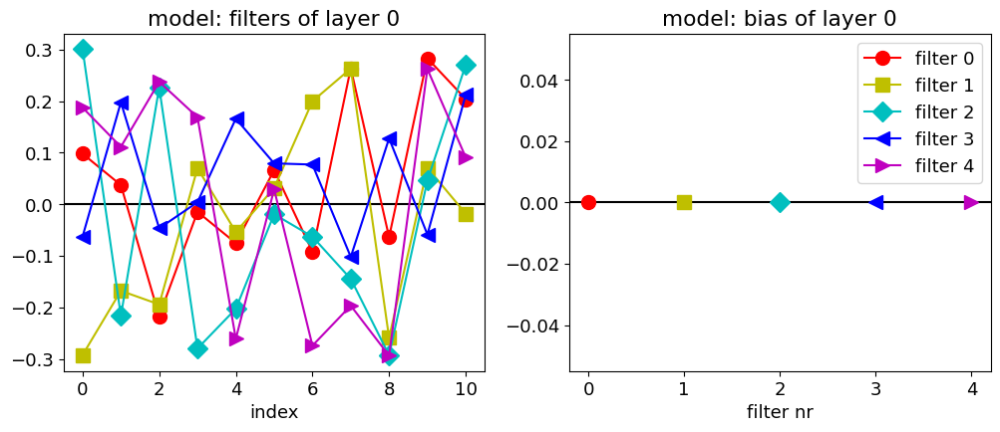

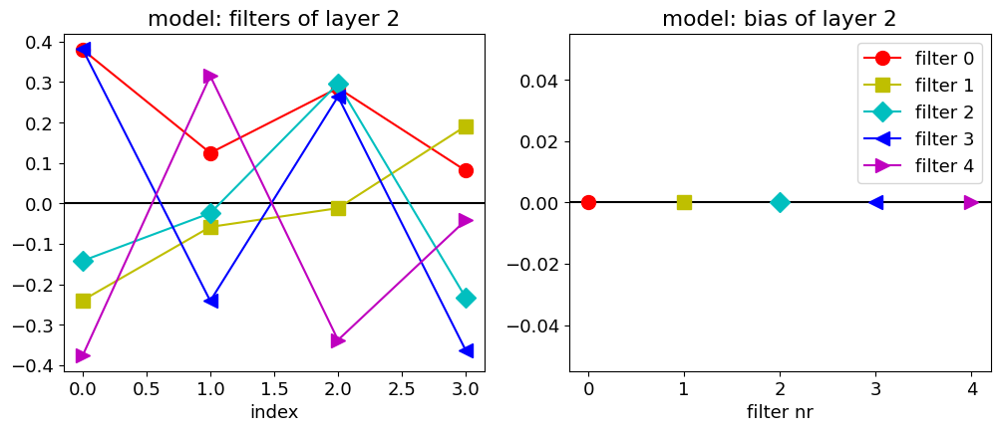

In [5]:
def Show_weights(model,l=0,label="model"):
    c=['r','y','c','b','m','k',"gray","cyan","g"]
    m=['o','s','D','<','>','^','+','x','d',"*"]
    ms=10
    
    w = model.layers[l].get_weights()[0]
    wT=w.T
    M=len(wT)
    b = model.layers[l].get_weights()[1]
    
    fig,AX=plt.subplots(1,2,figsize=(12,4.4))
    ax=AX[0]
    ax.axhline(0, c="k")
    ax.plot((0,))
    for i in range(M):
        ax.plot(wT[i][0],"-",c=c[i%len(c)],marker=m[i%len(m)],label=str(i),markersize=ms)
    ax.set_title(label+': filters of layer '+str(l))
    ax.set_xlabel('index')
    ax=AX[1]
    ax.axhline(0, c="k")
    for i in range(M):
        ax.plot((i),(b[i]),c=c[i%len(c)],marker=m[i%len(m)],label="filter "+str(i),markersize=ms)
    ax.set_title(label+': bias of layer '+str(l))
    ax.set_xlabel('filter nr')
    ax.set_xticks(np.arange(5))
    ax.legend()
    plt.show()
    
Show_weights(model,0)
Show_weights(model,2)

In [91]:
# ...LESSON ...
# Hyper-parameters
# with small minibatch it does not converge!! 
BATCH_SIZE = 200
EPOCHS = 300

print('----- Model ',NCONV,'-----\nFITTING....')
fit = model.fit(x_train,y_train,batch_size=BATCH_SIZE,
                epochs=EPOCHS,
                validation_data=(x_val, y_val),
                verbose=0, shuffle=True) 
print("end of fit")

----- Model  2 -----
FITTING....
end of fit


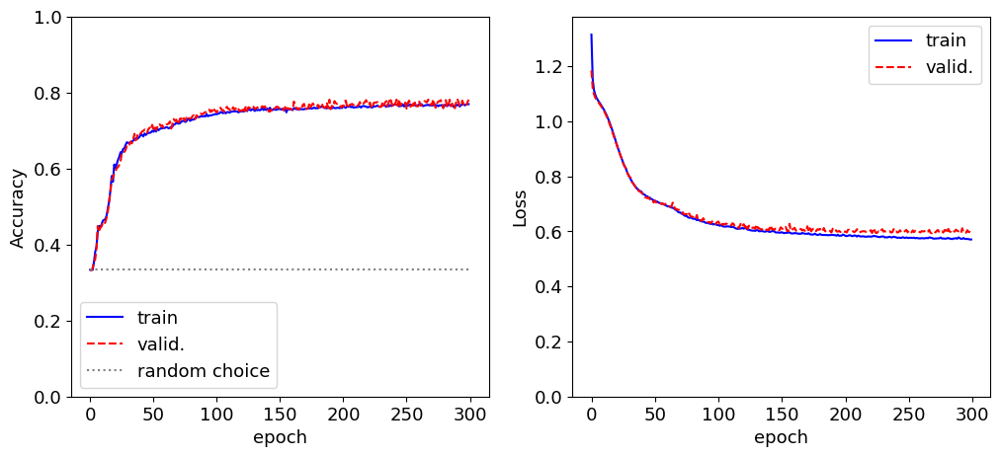

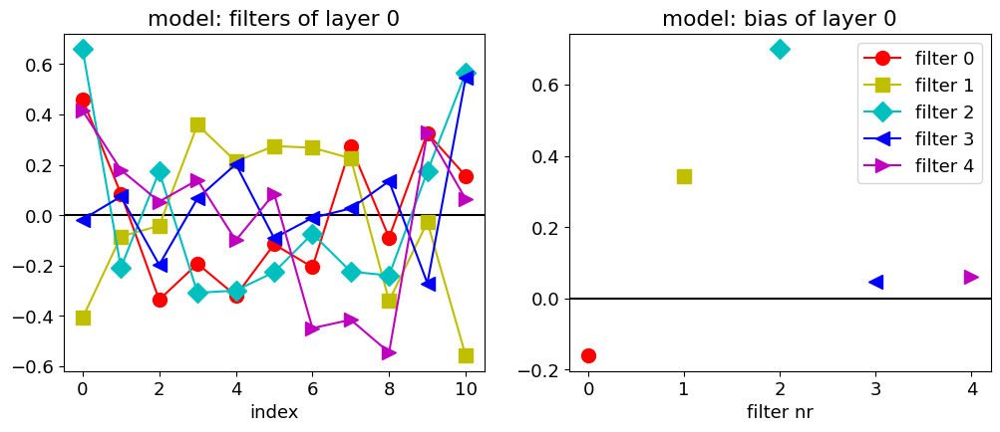

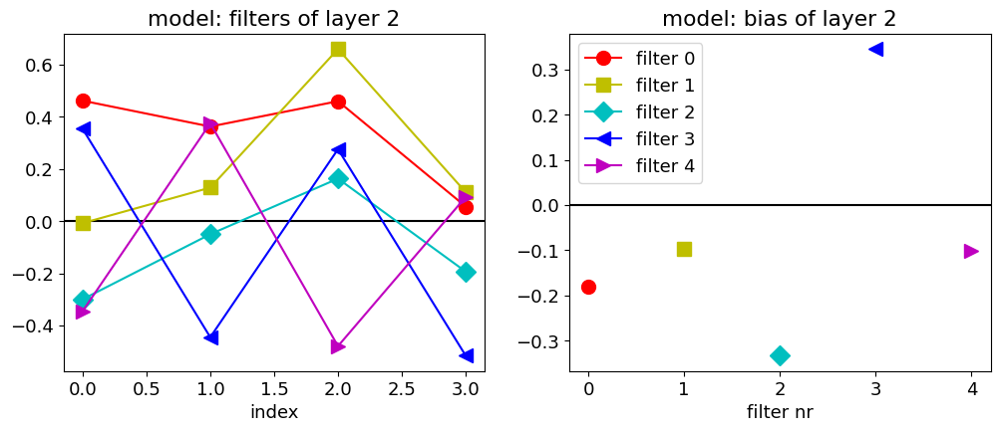

In [7]:
def Show_history(fit):
    fig,AX=plt.subplots(1,2,figsize=(12,5.))
    ax=AX[0]
    ax.plot(fit.history['accuracy'],"b",label="train")
    ax.plot(fit.history['val_accuracy'],"r--",label="valid.")
    ax.plot((0,EPOCHS),(1/3,1/3),":",c="gray",label="random choice")
    ax.set_xlabel('epoch')
    ax.set_ylabel("Accuracy")
    ax.set_ylim([0, 1])
    ax.legend()
    ax=AX[1]
    ax.plot(fit.history['loss'],"b",label="train")
    ax.plot(fit.history['val_loss'],"r--",label="valid.")
    ax.set_xlabel('epoch')
    ax.set_ylabel("Loss")
    ax.set_ylim([0, 1.05*np.max(fit.history['loss'])])
    ax.legend()
    plt.show()
Show_history(fit)
Show_weights(model,0)
Show_weights(model,2)

25/25 [==============================] - 0s 1ms/step


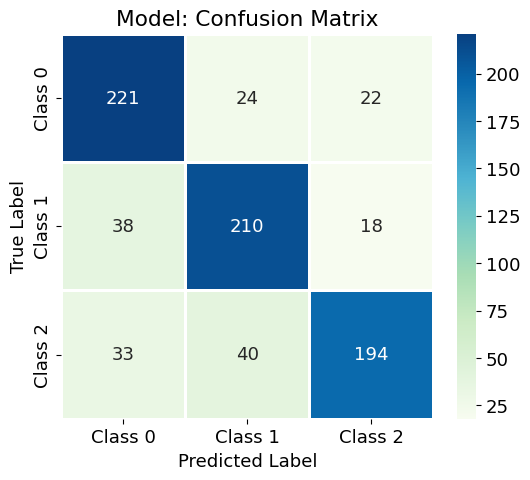

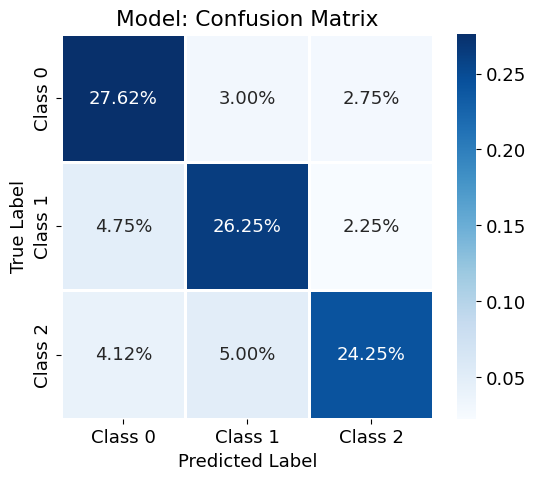

In [8]:
import pandas as pd
from scipy import stats

import seaborn 
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn import preprocessing

LABELS = ["Class 0","Class 1","Class 2"]

def show_confusion_matrix(validations, predictions, label="Model",perc=False):

    matrix = metrics.confusion_matrix(validations, predictions)
    plt.figure(figsize=(6, 5))
    M = matrix
    f = 'd'
    cmap="GnBu"
    if perc:
        M=M/np.sum(M)
        f='.2%'
        cmap='Blues'
    seaborn.heatmap(M,
                xticklabels=LABELS,
                yticklabels=LABELS,
                annot=True,
                fmt=f,
                linecolor='white',
                linewidths=1,
                cmap=cmap)
    plt.title(label+': Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

y_pred_val = np.array(model.predict(x_val))
# Take the class with the highest probability from the val predictions
max_y_pred_val = np.argmax(y_pred_val, axis=1)
max_y_val = np.argmax(y_val, axis=1)

show_confusion_matrix(max_y_val, max_y_pred_val)
show_confusion_matrix(max_y_val, max_y_pred_val,perc=True)

In [86]:
model2 = keras.models.clone_model(model)

reg2 = keras.regularizers.l2(0.5)
model2.layers[0].kernel_regularizer = reg2
model2.layers[1].kernel_regularizer = reg2
model2.layers[2].kernel_regularizer = reg2

opt = tf.keras.optimizers.legacy.Adam()
model2.compile(loss=keras.losses.categorical_crossentropy,optimizer=opt,metrics=['accuracy'])

BATCH_SIZE2 = 200
EPOCHS2 = 300

fit2 = model2.fit(x_train,y_train,batch_size=BATCH_SIZE2,epochs=EPOCHS2,
                validation_data=(x_val, y_val), verbose=0, shuffle=True) 

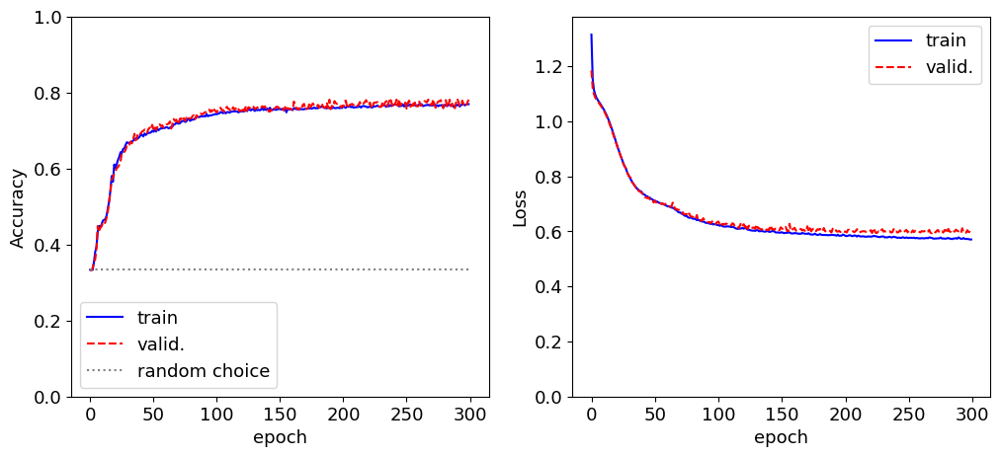

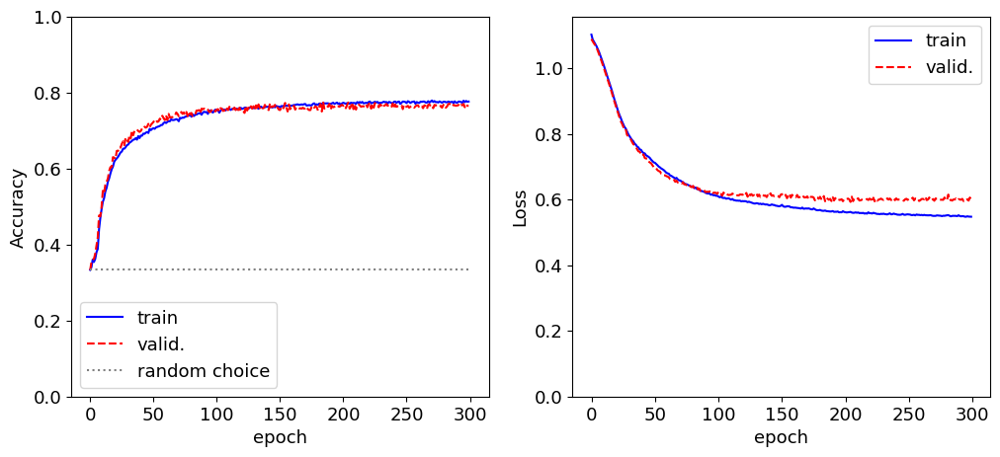

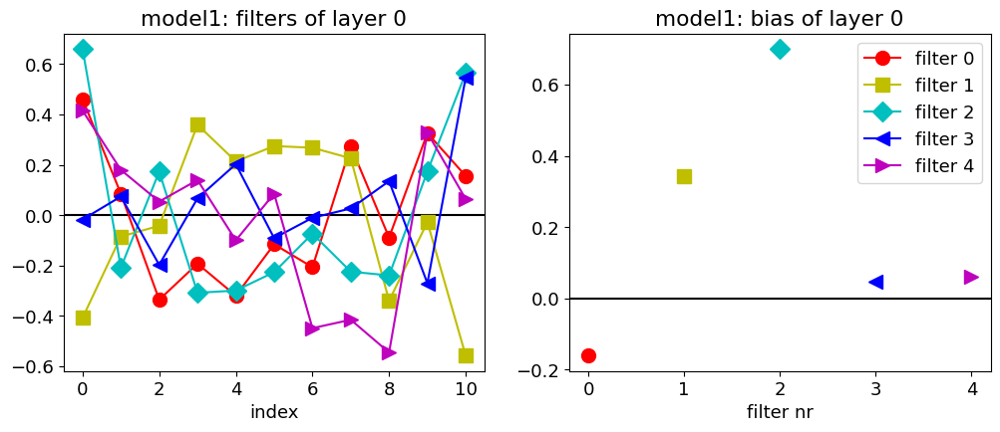

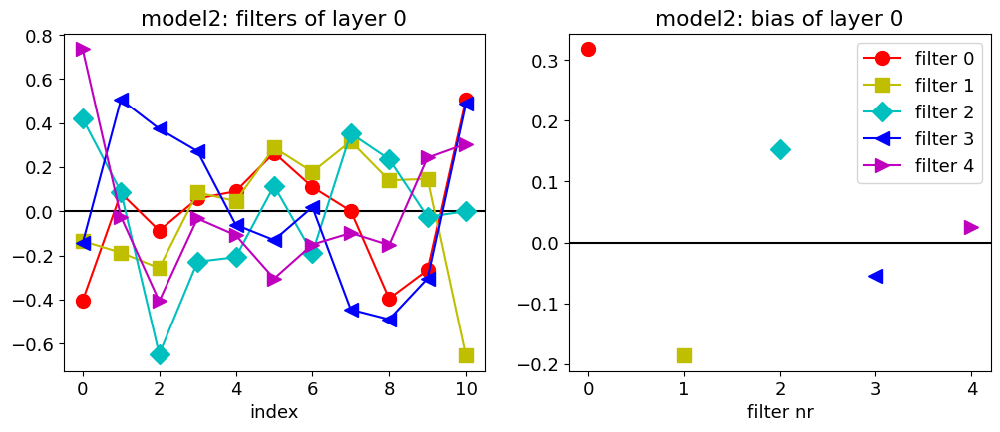

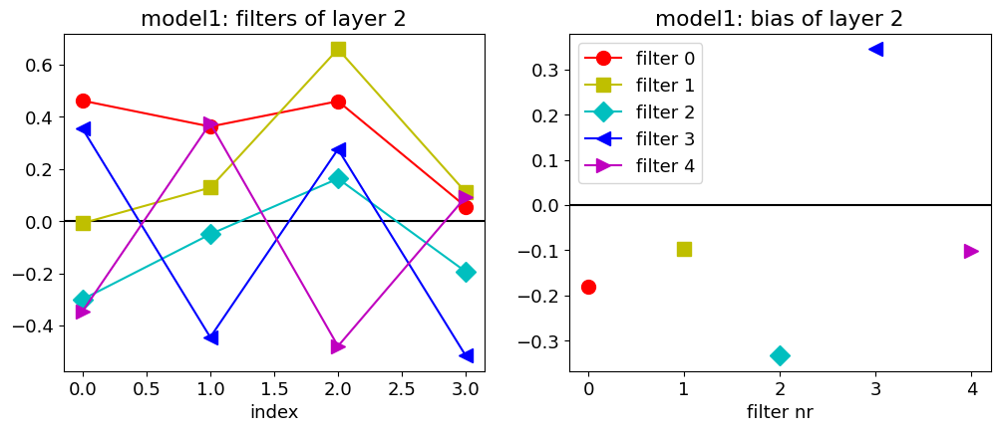

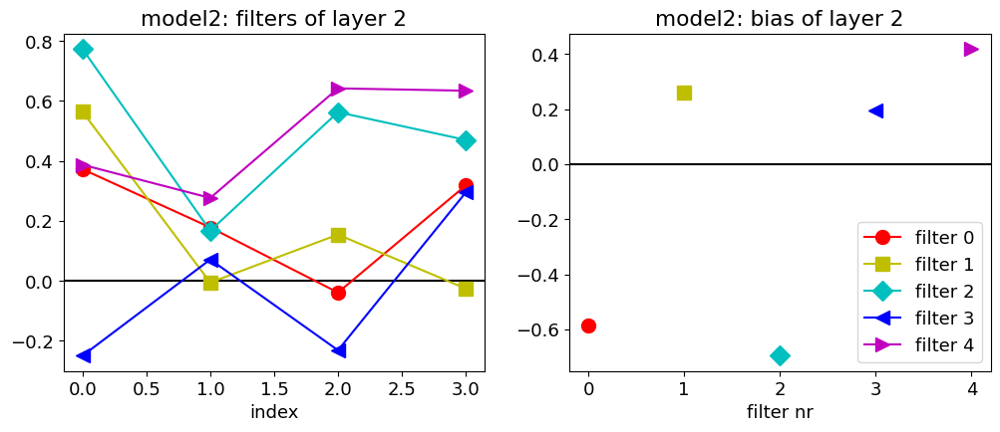

25/25 [==============================] - 0s 1ms/step


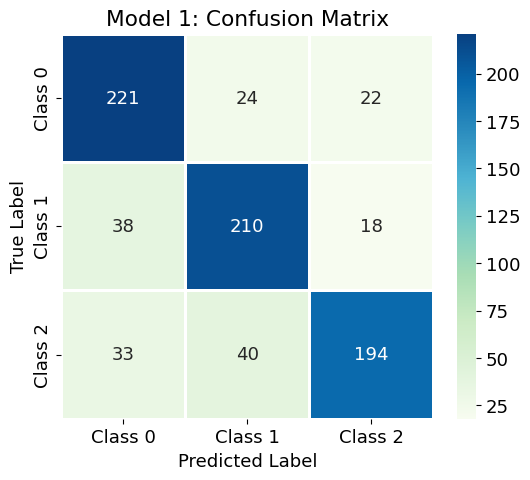

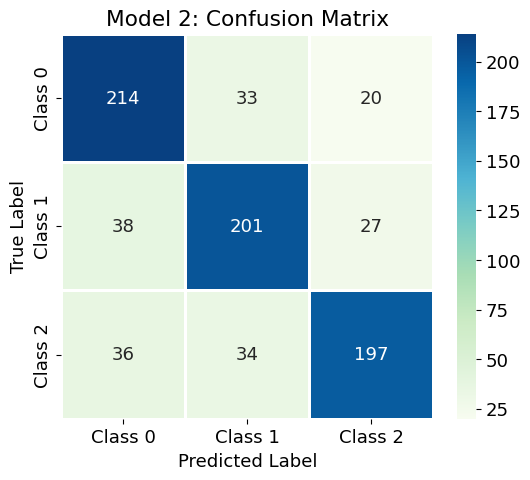

In [10]:

Show_history(fit)
Show_history(fit2)

Show_weights(model,0,label="model1")
Show_weights(model2,0,label="model2")
Show_weights(model,2,label="model1")
Show_weights(model2,2,label="model2")


y_pred_val2 = model2.predict(x_val)
# Take the class with the highest probability from the val predictions
max_y_pred_val2 = np.argmax(y_pred_val2, axis=1)

show_confusion_matrix(max_y_val, max_y_pred_val, label="Model 1")
show_confusion_matrix(max_y_val, max_y_pred_val2, label="Model 2")

### We chose the (G) configuration, with global max pooling on the final layer, because it showed a better agreement between training and validation error, w.r.t. the (D) configiration that appears to incur in overfitting.

# Optimizer comparison, with different learning rates

In [80]:
optimizer_keys=['Adam', 'Nadam','Nestor','RMSprop', 'Adamax']
optimizer_functions=[tf.keras.optimizers.legacy.Adam,tf.keras.optimizers.legacy.Nadam,tf.keras.optimizers.legacy.SGD, tf.keras.optimizers.legacy.RMSprop,tf.keras.optimizers.legacy.Adamax]
optimizers=dict(zip(optimizer_keys, optimizer_functions))

resultsA={}
for lrexp in range(2,7):
    lr=10**-lrexp
    for optimizer in optimizers.items():
            accs=[]
            for i in range(5):
                '(learning_rate=lr, momentum=0.9, nesterov=True)'
                if optimizer[0]=='Nestor':
                    opt=optimizer[1](learning_rate=lr, momentum=0.9, nesterov=True)
                else:
                    opt=optimizer[1](learning_rate=lr)

                model3 = keras.models.clone_model(model)

                reg3 = keras.regularizers.l2(0.5)
                model3.layers[0].kernel_regularizer = reg3
                model3.layers[1].kernel_regularizer = reg3
                model3.layers[2].kernel_regularizer = reg3

                model3.compile(loss=keras.losses.categorical_crossentropy,optimizer=opt,metrics=['accuracy'])

                BATCH_SIZE2 = 200
                EPOCHS2 = 50

                fit3 = model3.fit(x_train,y_train,batch_size=BATCH_SIZE2,epochs=EPOCHS2,
                                validation_data=(x_val, y_val), verbose=0, shuffle=True) 
                accs.append(fit3.history['val_accuracy'][-1])
            accs=np.array(accs)
            avg=accs.mean()
            std=accs.std()
                
            if (optimizer[0] in resultsA.keys()):
                resultsA[optimizer[0]][0].append(lr)
                resultsA[optimizer[0]][1].append(avg)
                resultsA[optimizer[0]][2].append(std)
            else:
                resultsA[optimizer[0]]=[[lr],[avg], [std]]
            print(optimizer[0],lr,fit3.history['val_accuracy'][-1])

Adam 0.01 0.7674999833106995
Nadam 0.01 0.7799999713897705
Nestor 0.01 0.7599999904632568
RMSprop 0.01 0.78125
Adamax 0.01 0.7200000286102295
Adam 0.001 0.6899999976158142
Nadam 0.001 0.7637500166893005
Nestor 0.001 0.3737500011920929
RMSprop 0.001 0.6675000190734863
Adamax 0.001 0.6762499809265137
Adam 0.0001 0.3725000023841858
Nadam 0.0001 0.3487499952316284
Nestor 0.0001 0.3412500023841858
RMSprop 0.0001 0.36125001311302185
Adamax 0.0001 0.39500001072883606
Adam 1e-05 0.33250001072883606
Nadam 1e-05 0.3412500023841858
Nestor 1e-05 0.2824999988079071
RMSprop 1e-05 0.33250001072883606
Adamax 1e-05 0.3412500023841858
Adam 1e-06 0.3487499952316284
Nadam 1e-06 0.32875001430511475
Nestor 1e-06 0.33250001072883606
RMSprop 1e-06 0.33375000953674316
Adamax 1e-06 0.33375000953674316


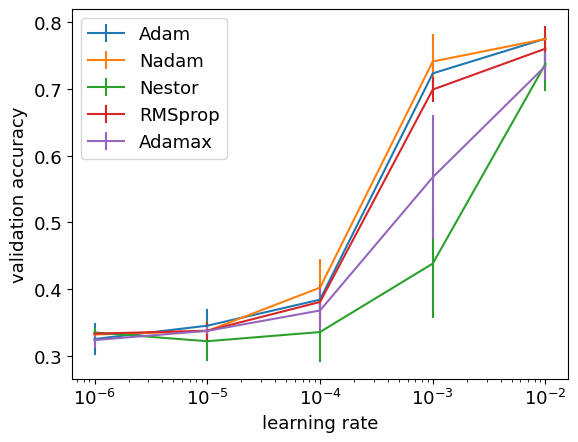

In [83]:
for key in resultsA:
    plt.errorbar(resultsA[key][0],resultsA[key][1],resultsA[key][2], label=key)
    plt.xscale('log')
    plt.ylabel('validation accuracy')
    plt.xlabel('learning rate')
    plt.legend()

### Looking at the previous results we chose the Nadam regularizer, and adopt it for the following runs.

In [53]:
best_lr=0.0001
best_opt=tf.keras.optimizers.legacy.Nadam(learning_rate=best_lr)
my_BATCH_SIZE=200
my_EPOCHS=300

3 4 0 0.33375000953674316


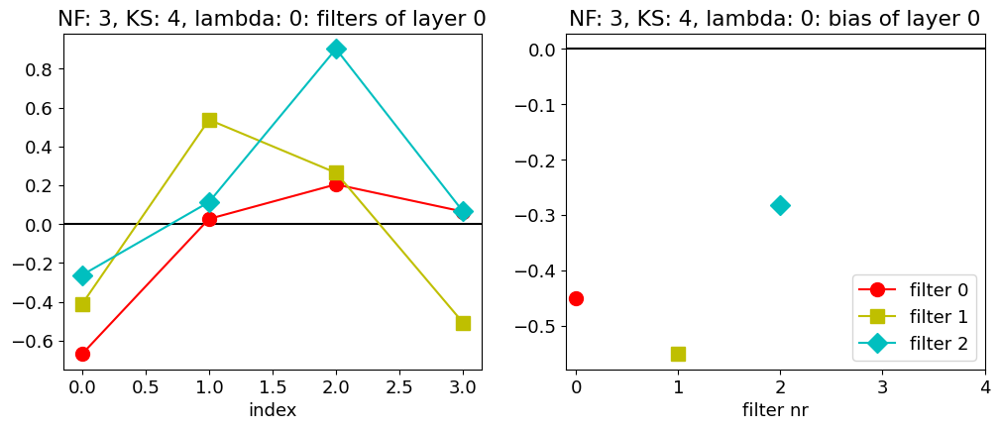

3 4 1e-05 0.5512499809265137


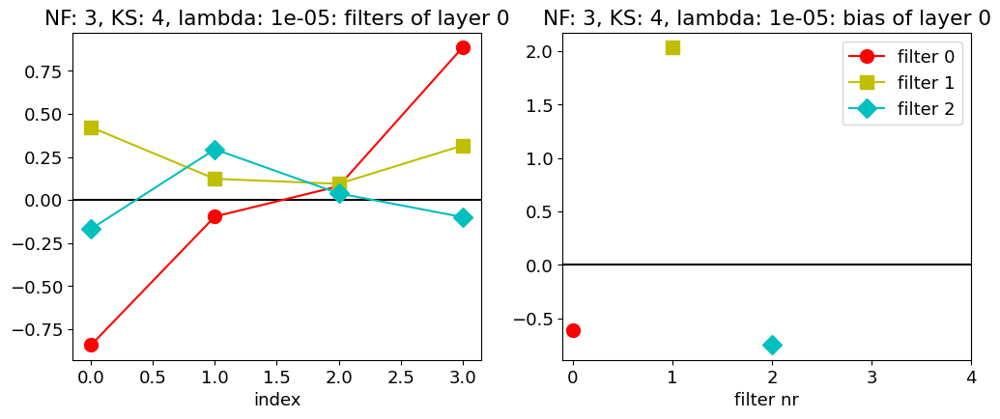

3 4 0.0001 0.6937500238418579


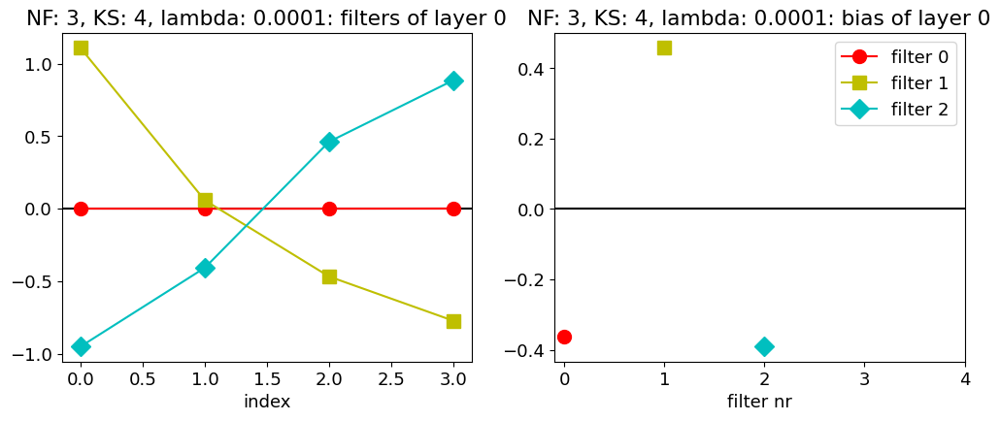

3 4 0.001 0.5787500143051147


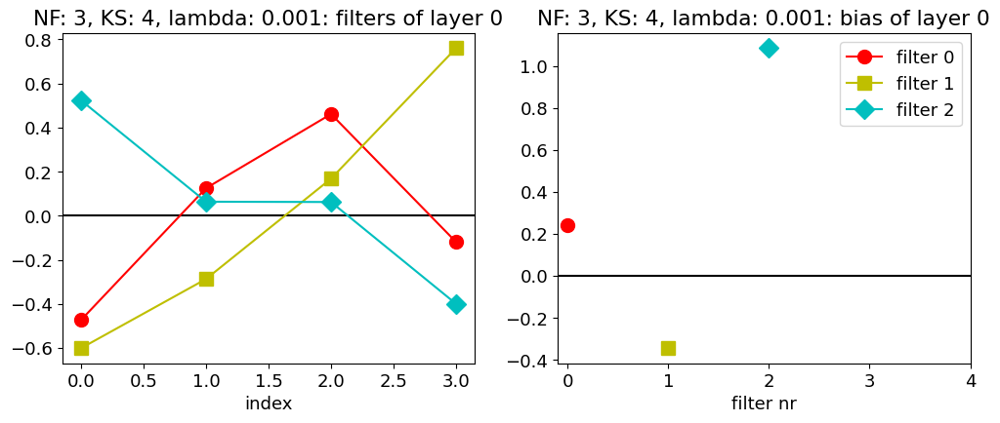

3 4 0.01 0.33375000953674316


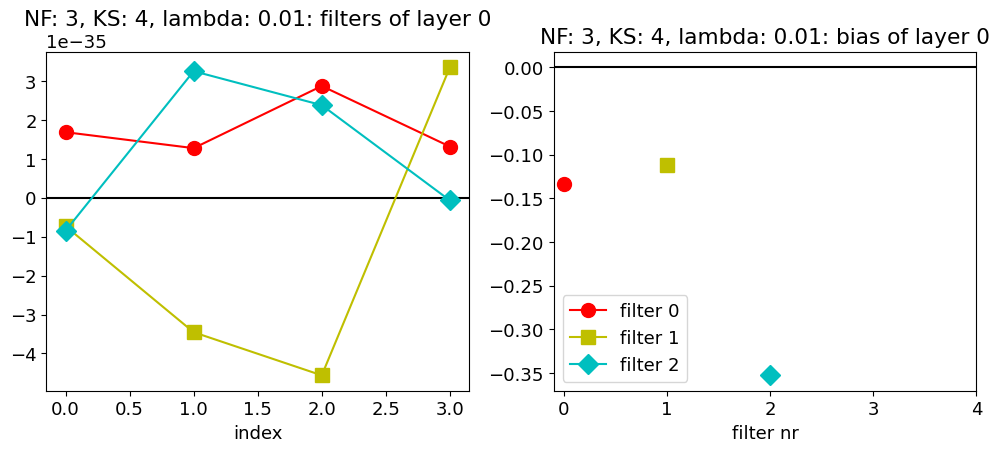

3 5 0 0.668749988079071


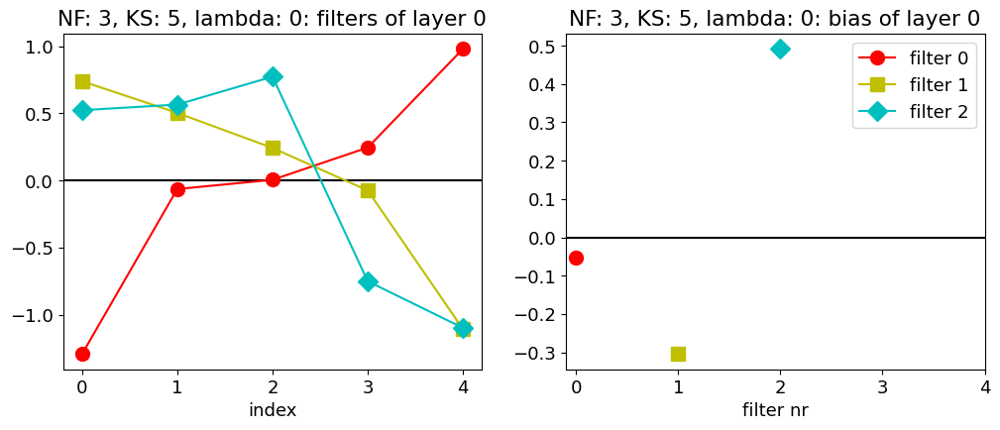

3 5 1e-05 0.6875


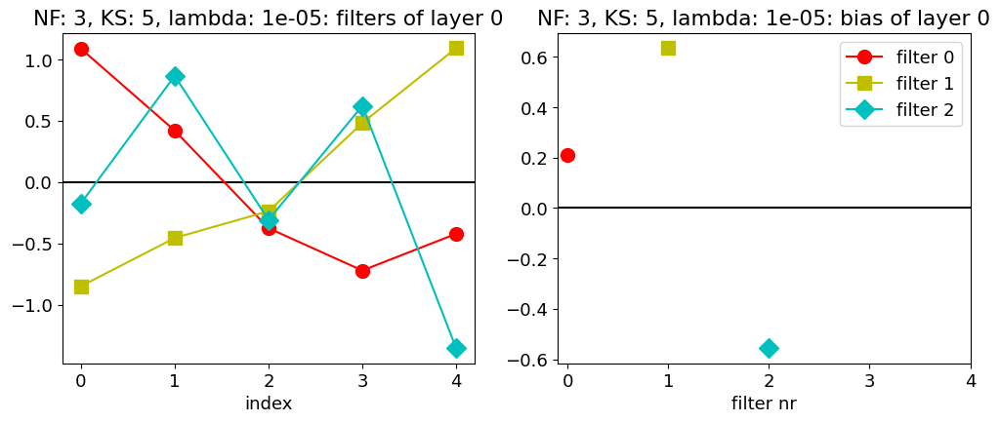

3 5 0.0001 0.6912500262260437


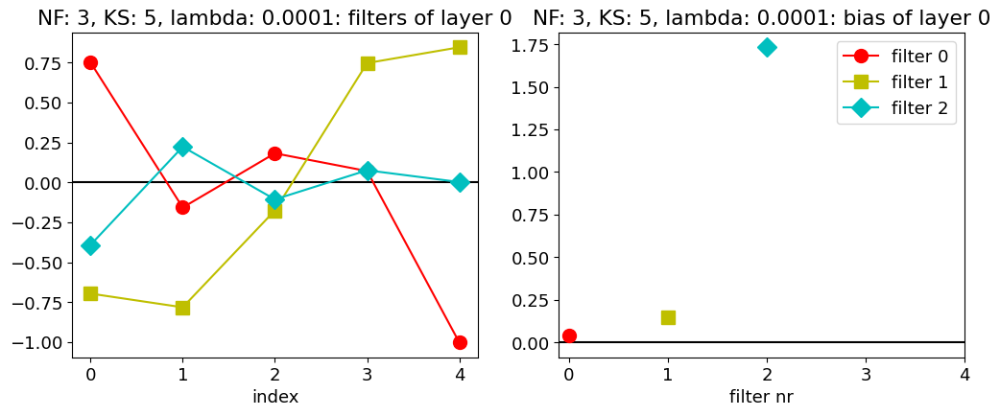

3 5 0.001 0.5637500286102295


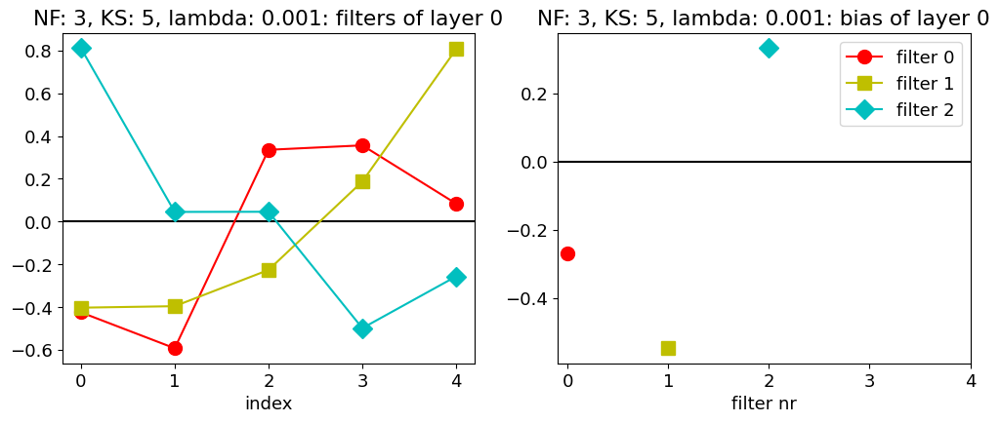

3 5 0.01 0.33375000953674316


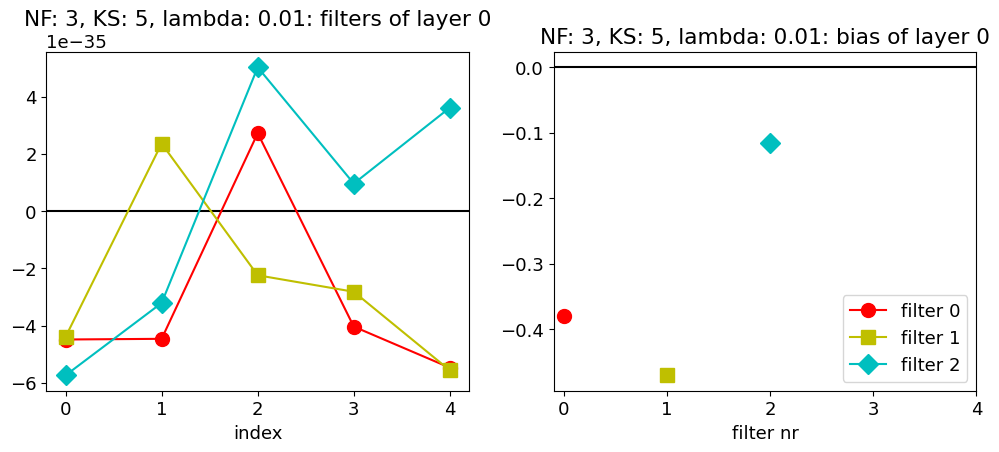

3 6 0 0.7024999856948853


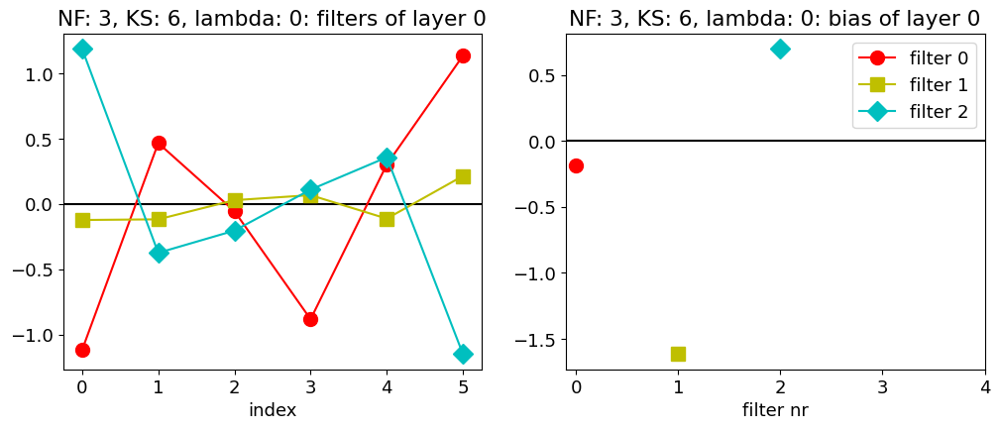

3 6 1e-05 0.6912500262260437


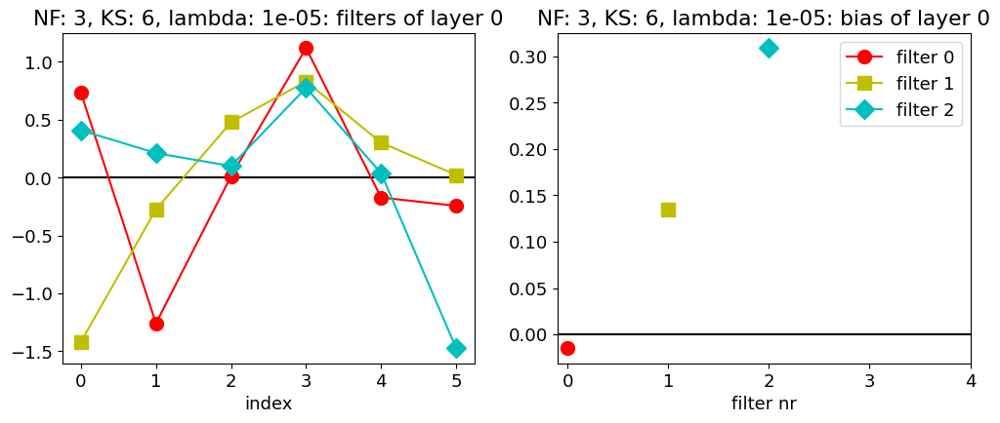

3 6 0.0001 0.5774999856948853


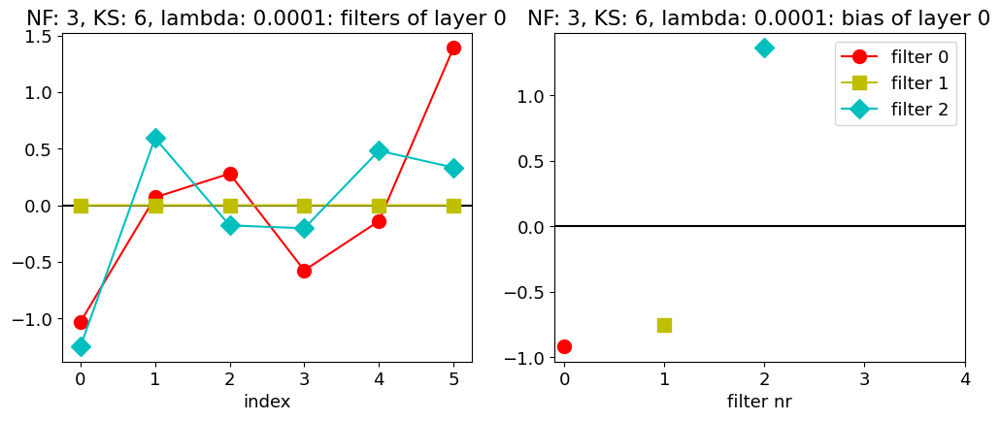

3 6 0.001 0.768750011920929


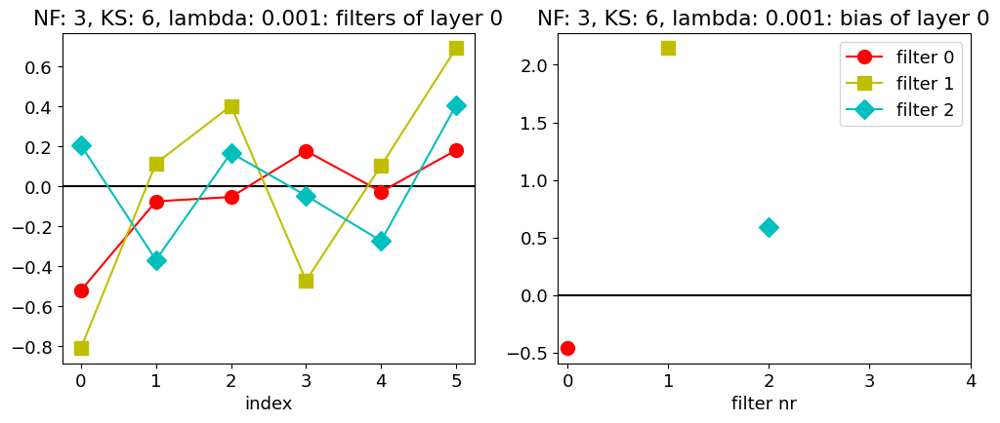

3 6 0.01 0.33375000953674316


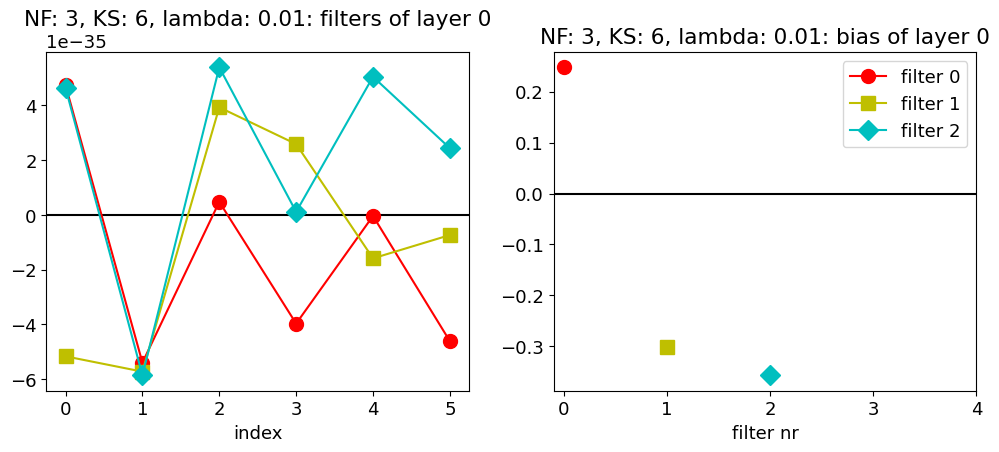

3 7 0 0.33375000953674316


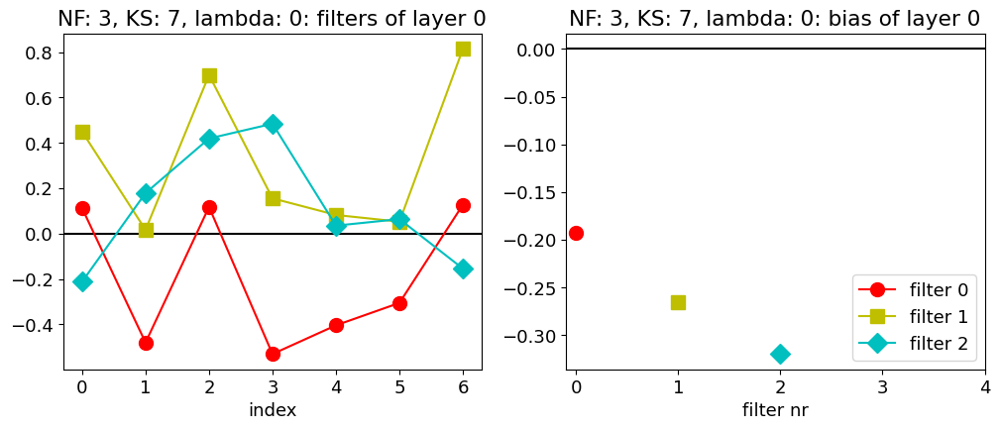

3 7 1e-05 0.6637499928474426


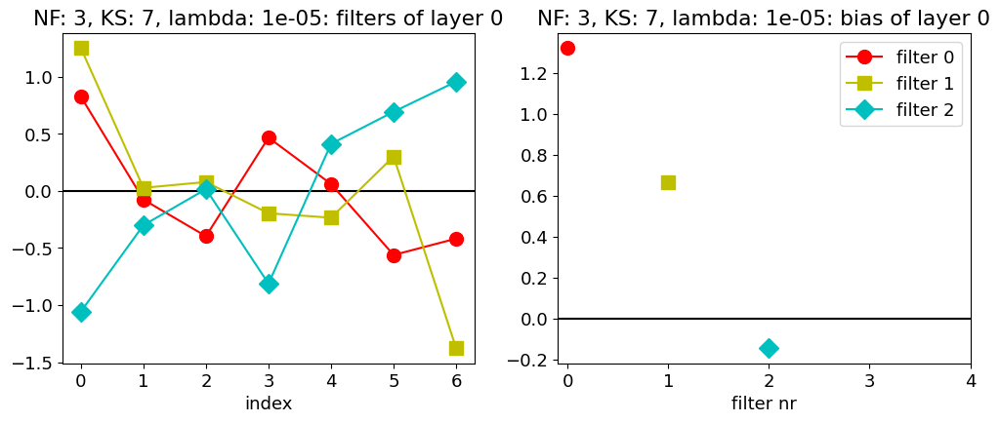

3 7 0.0001 0.7787500023841858


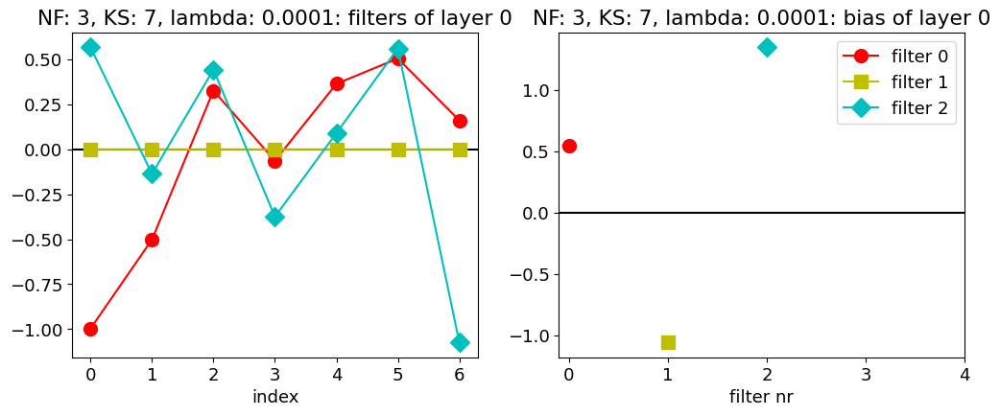

3 7 0.001 0.6549999713897705


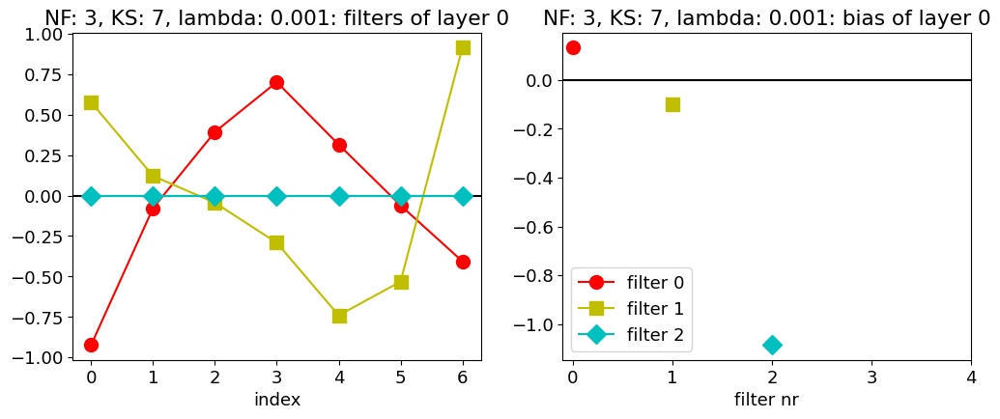

3 7 0.01 0.7587500214576721


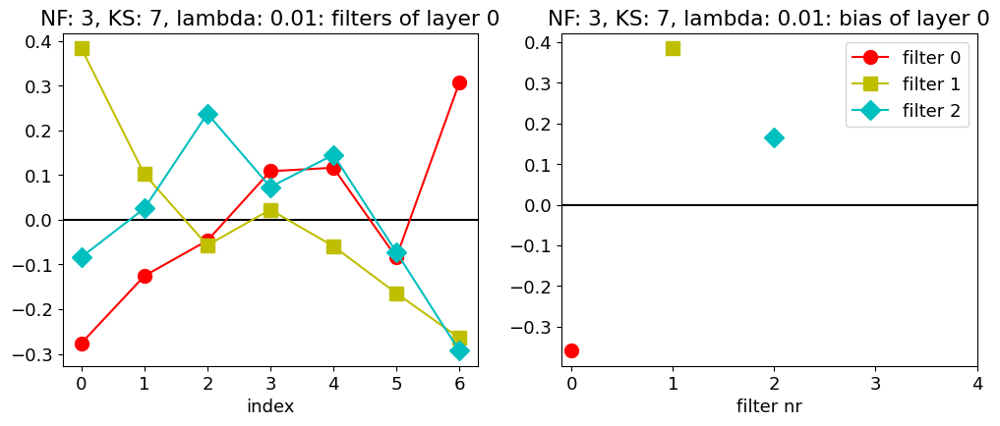

3 8 0 0.33375000953674316


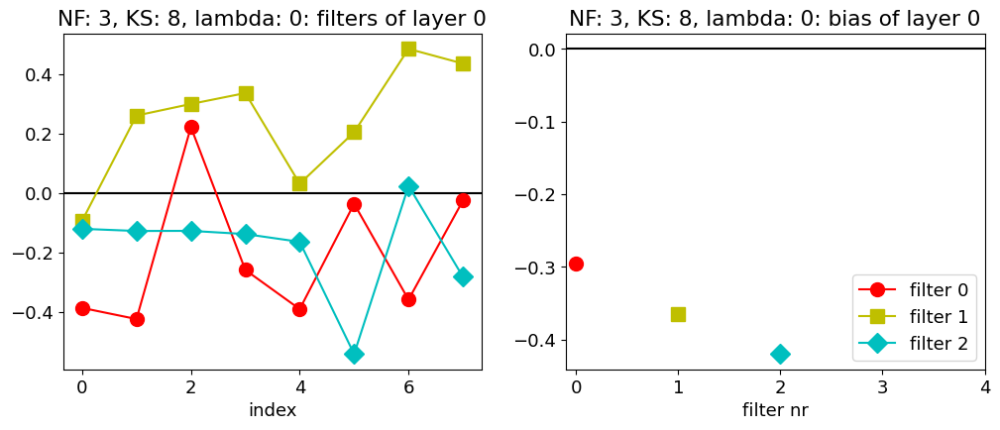

3 8 1e-05 0.33375000953674316


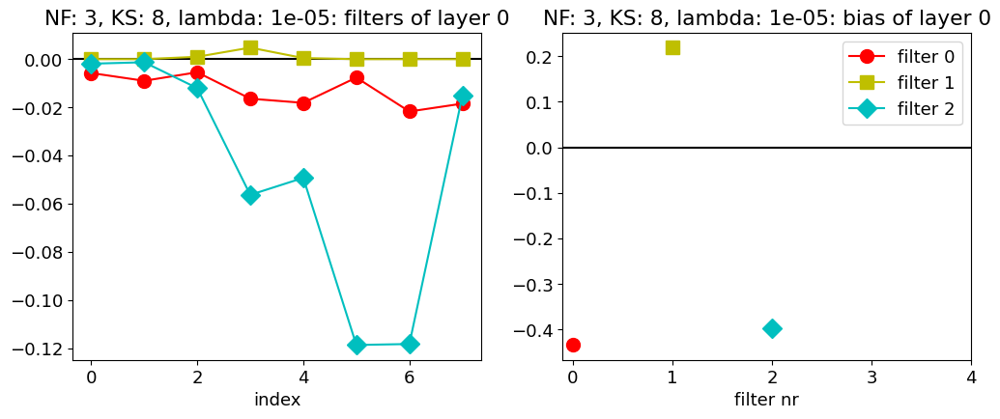

3 8 0.0001 0.33375000953674316


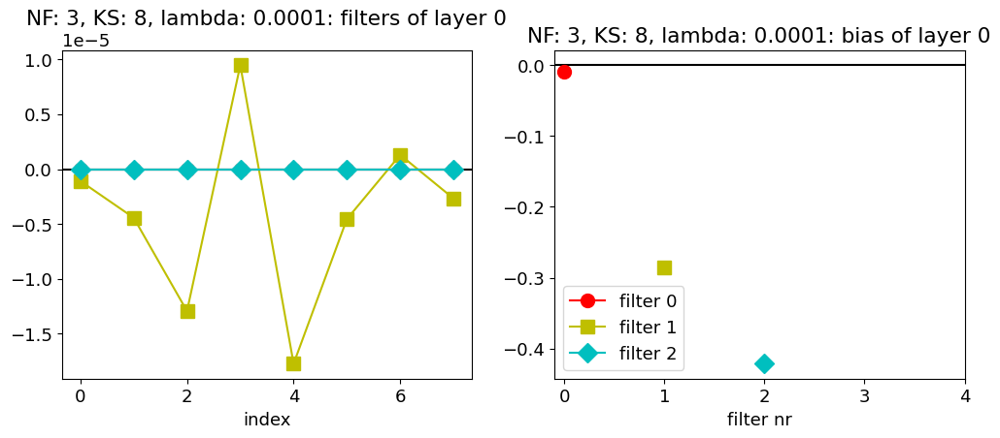

3 8 0.001 0.6299999952316284


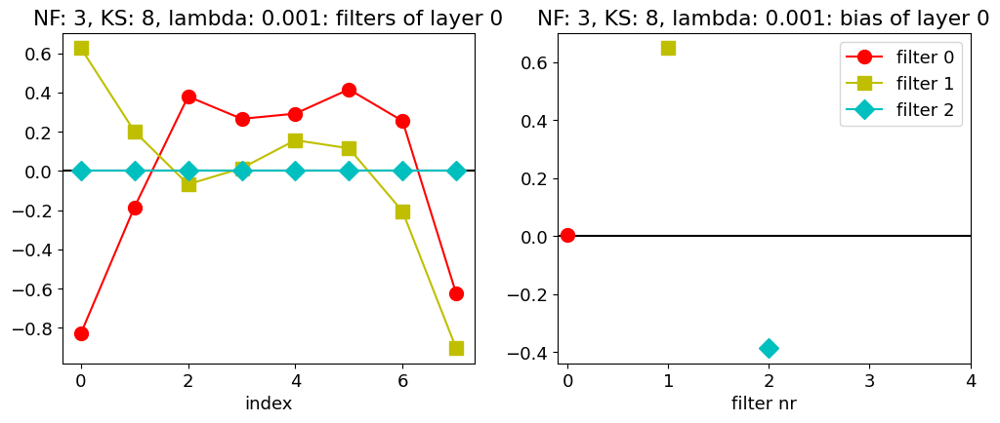

3 8 0.01 0.33375000953674316


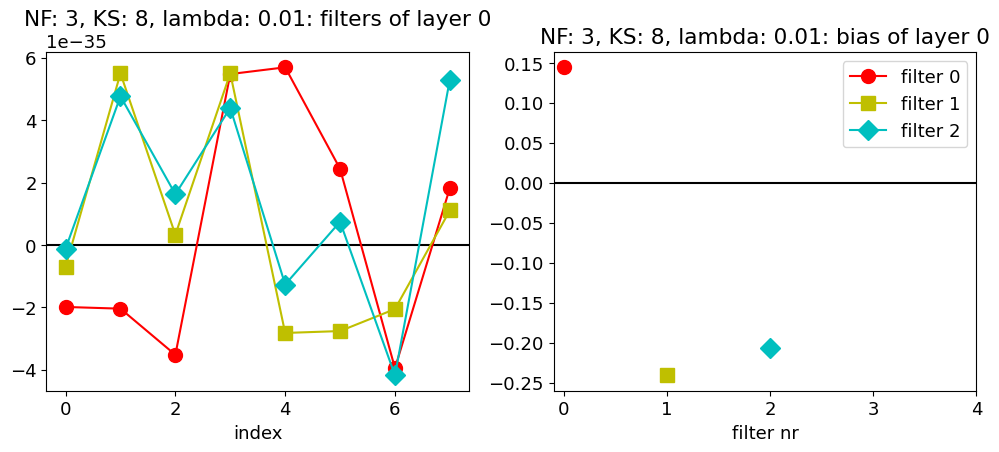

4 4 0 0.33375000953674316


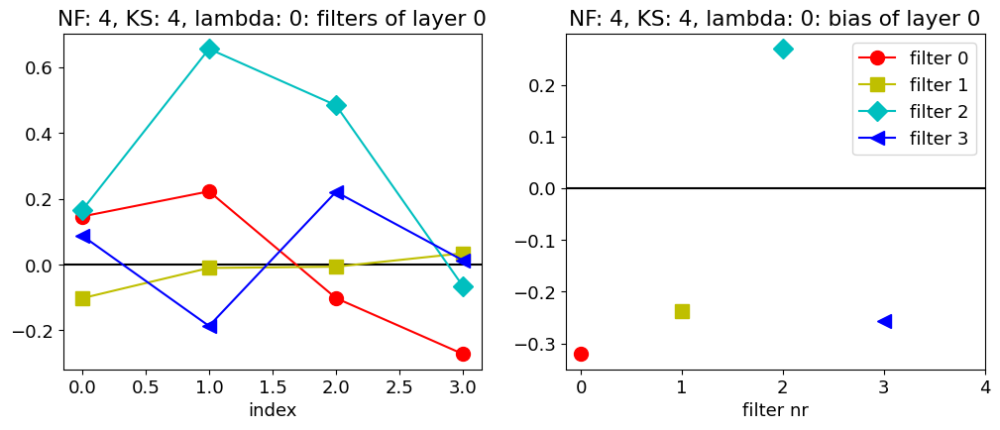

4 4 1e-05 0.33375000953674316


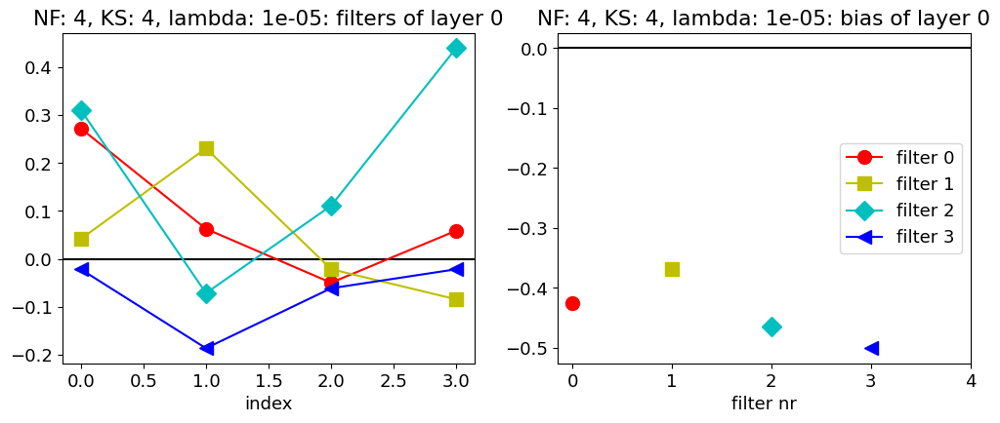

4 4 0.0001 0.731249988079071


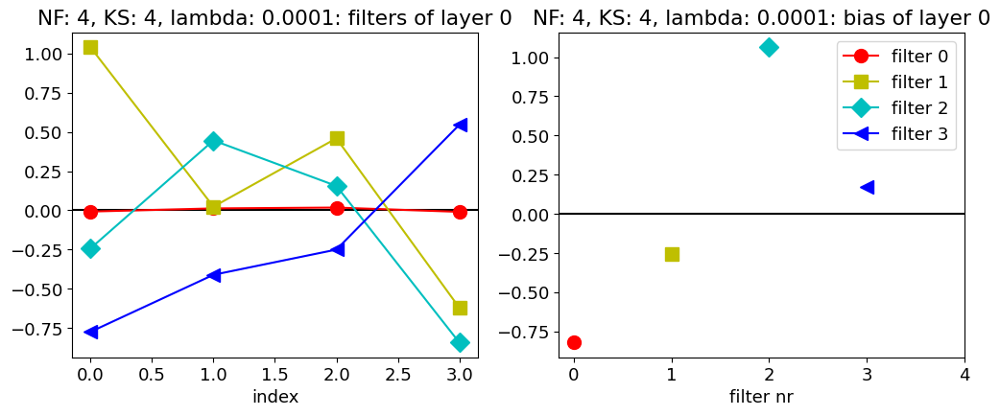

4 4 0.001 0.6875


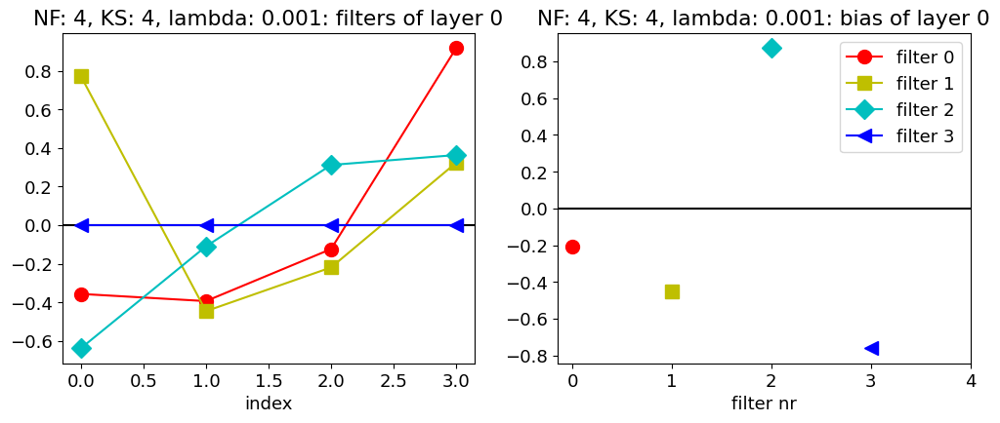

4 4 0.01 0.33375000953674316


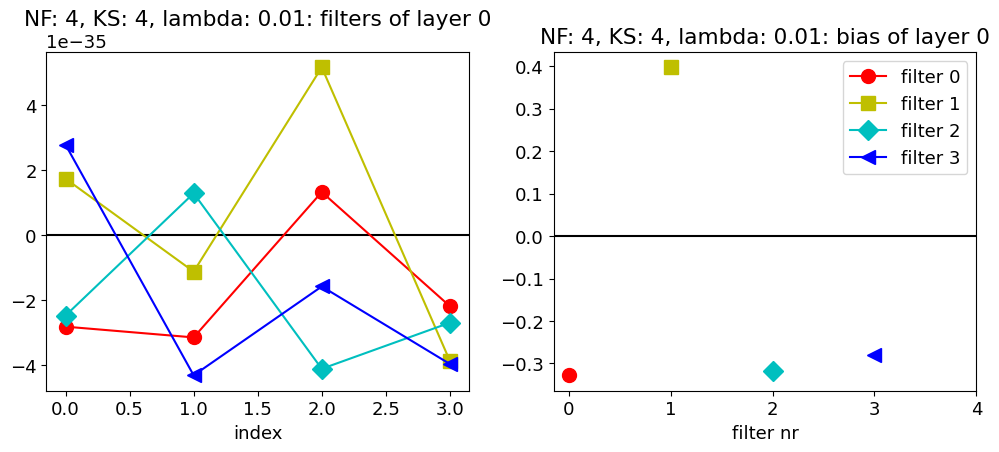

4 5 0 0.699999988079071


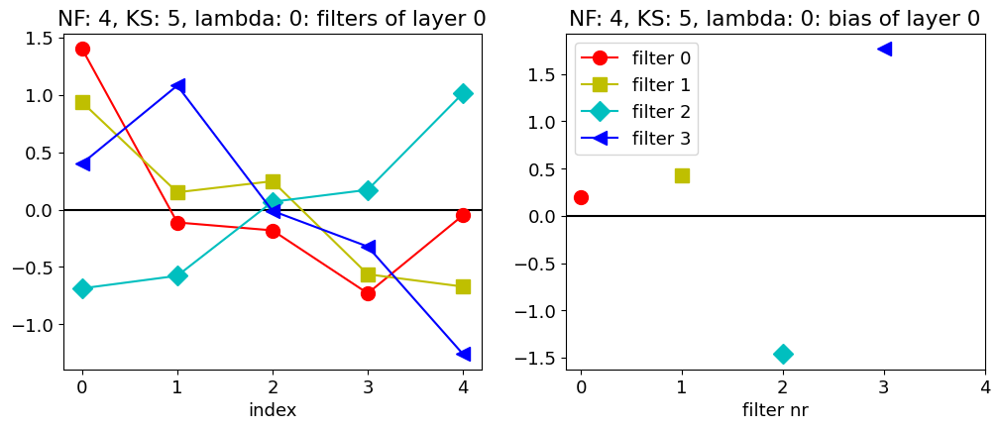

4 5 1e-05 0.6899999976158142


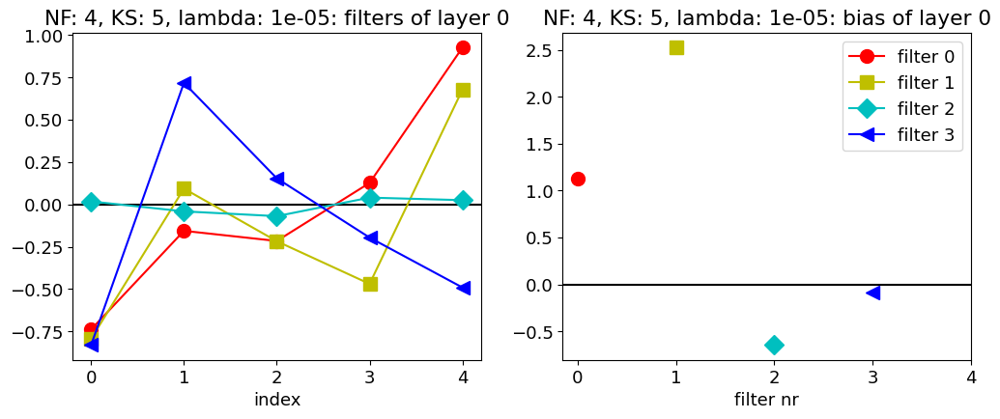

4 5 0.0001 0.6800000071525574


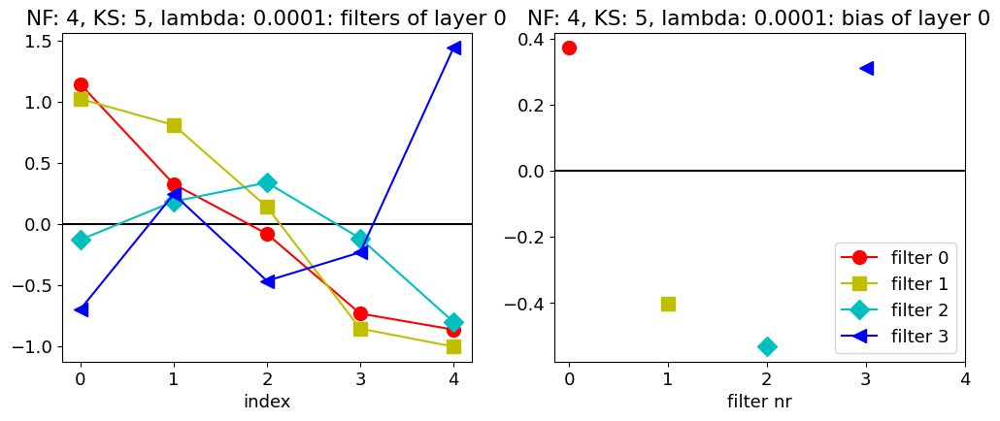

4 5 0.001 0.33375000953674316


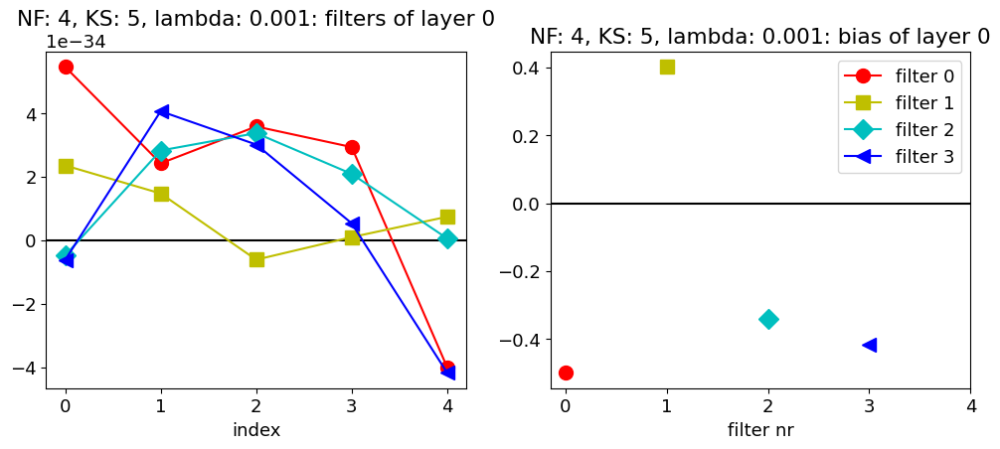

4 5 0.01 0.5787500143051147


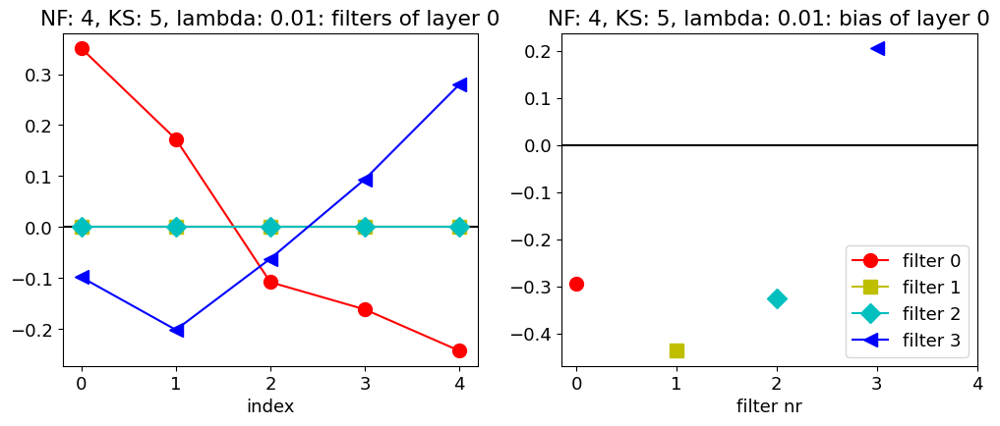

4 6 0 0.33375000953674316


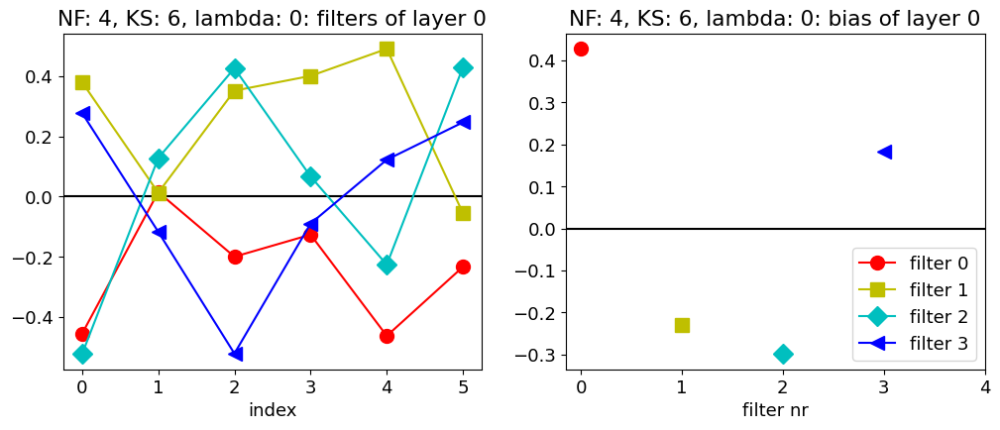

4 6 1e-05 0.6862499713897705


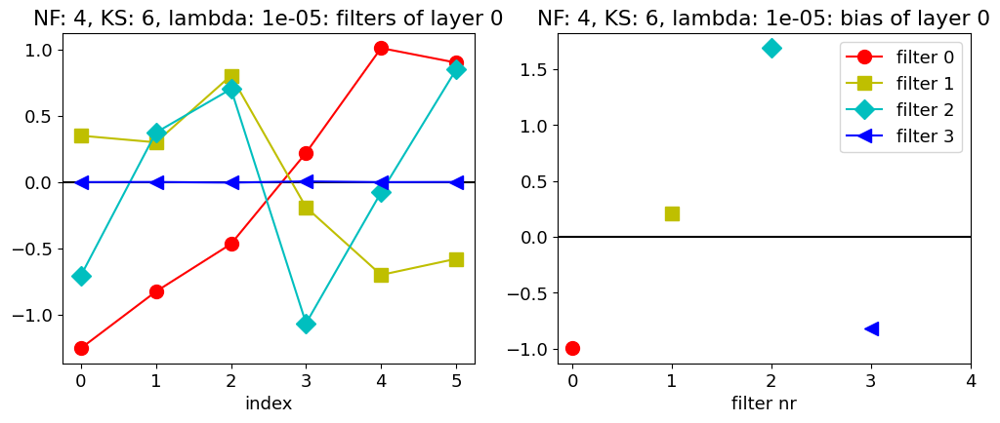

4 6 0.0001 0.5537499785423279


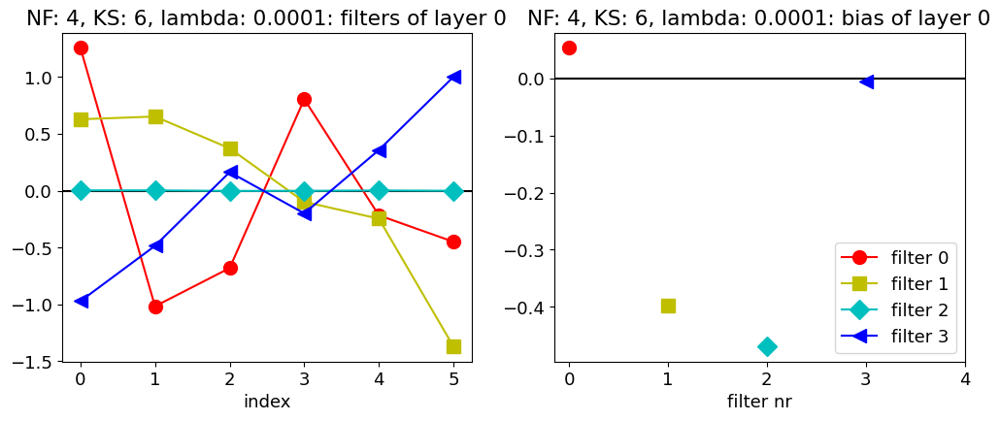

4 6 0.001 0.7512500286102295


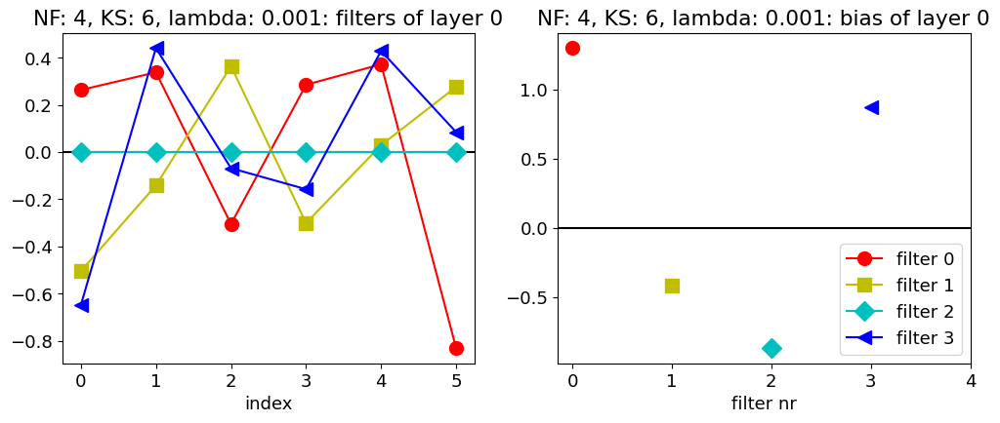

4 6 0.01 0.33375000953674316


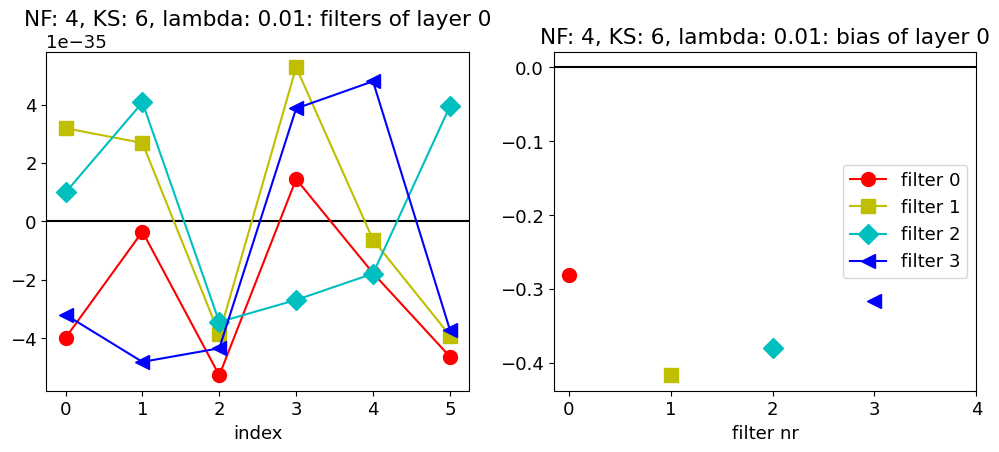

4 7 0 0.7599999904632568


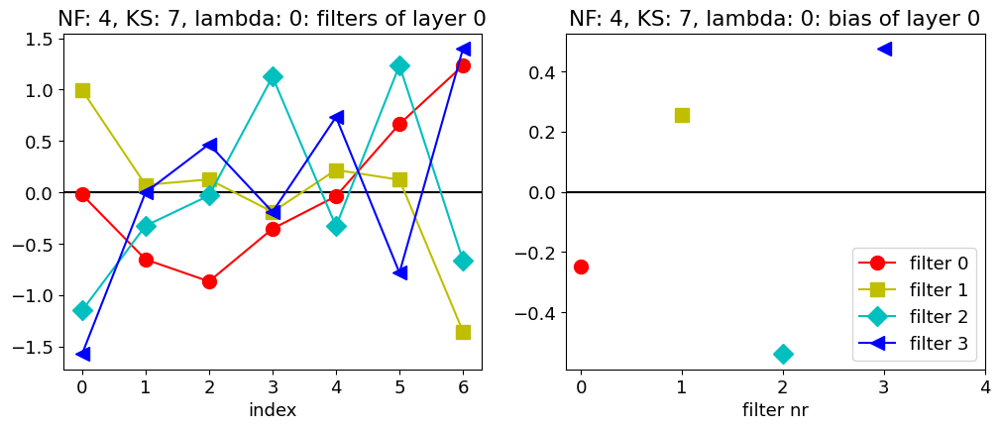

4 7 1e-05 0.7450000047683716


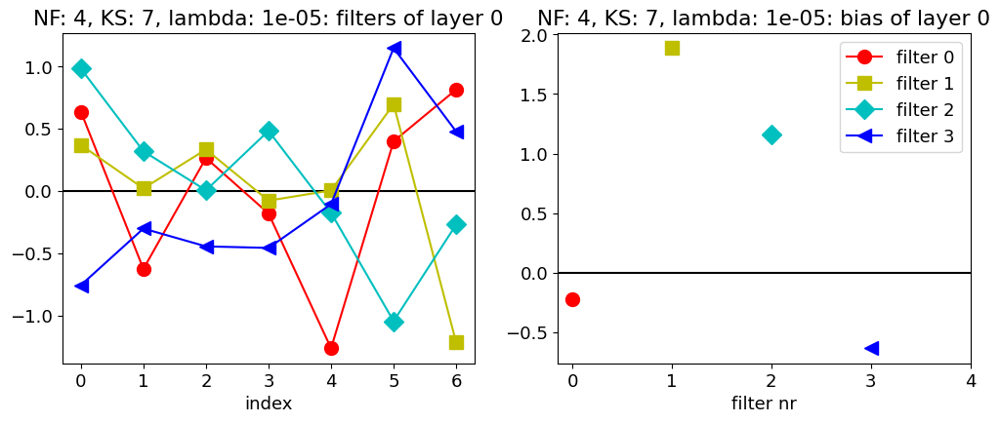

4 7 0.0001 0.7912499904632568


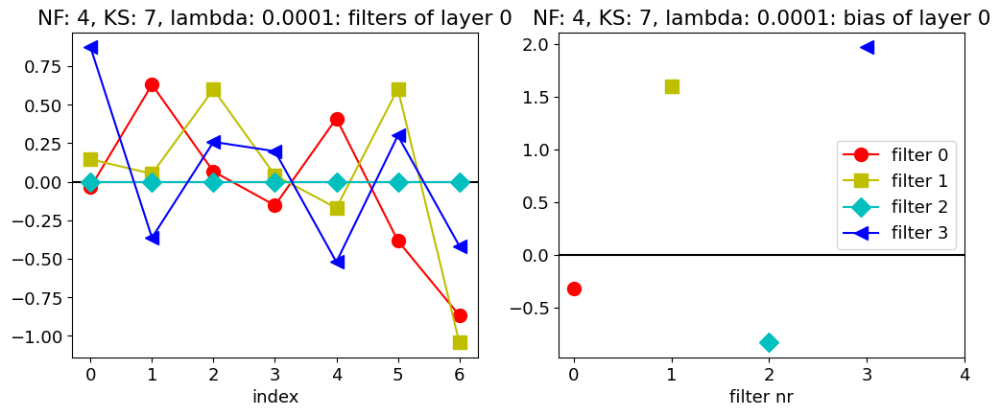

4 7 0.001 0.7862499952316284


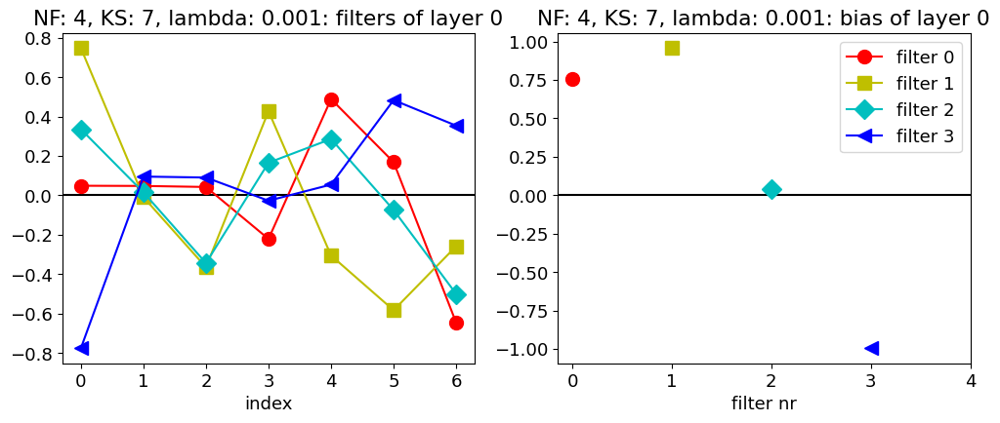

4 7 0.01 0.6424999833106995


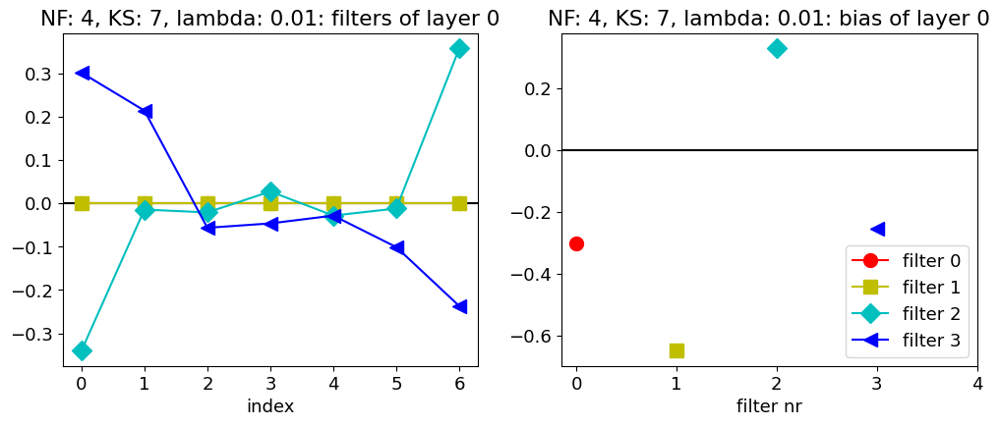

4 8 0 0.78125


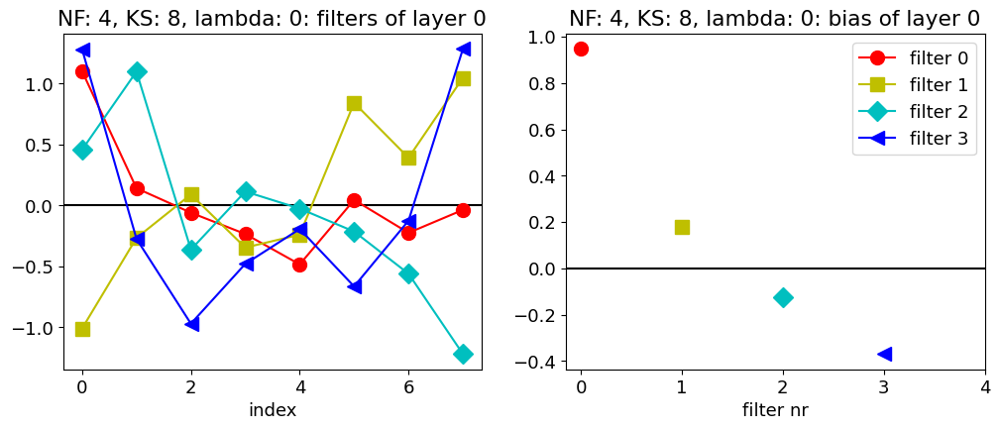

4 8 1e-05 0.33375000953674316


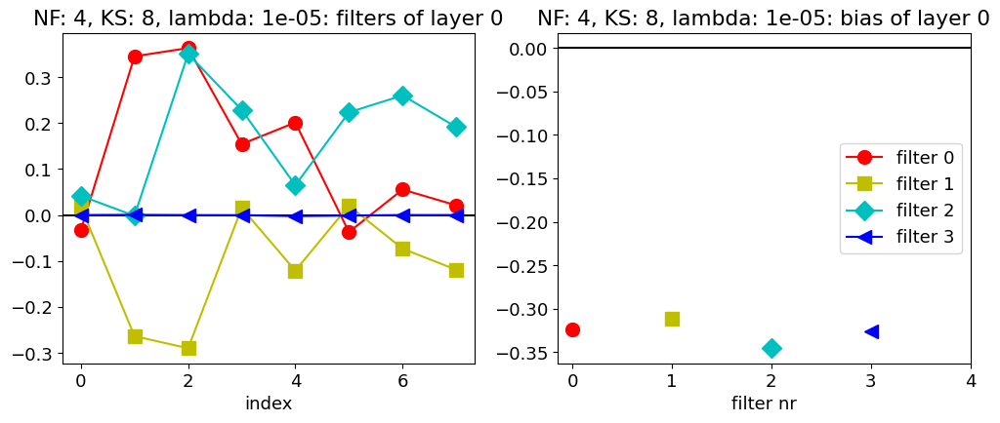

4 8 0.0001 0.33375000953674316


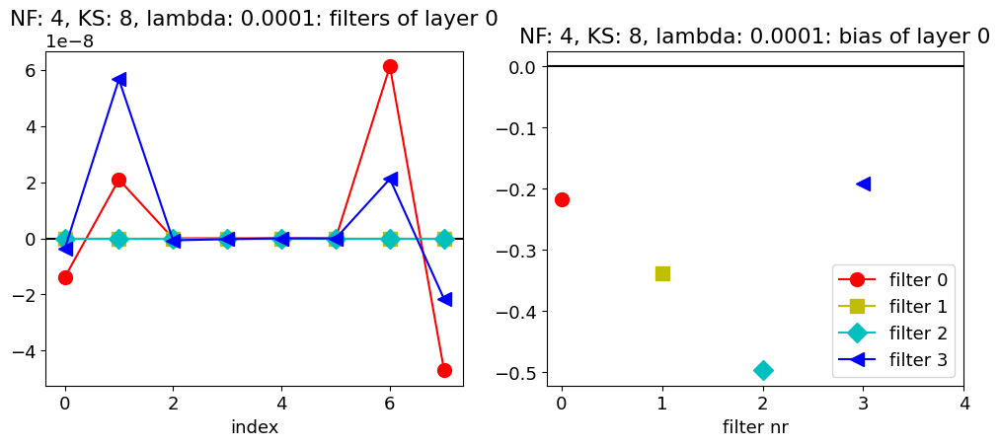

4 8 0.001 0.6474999785423279


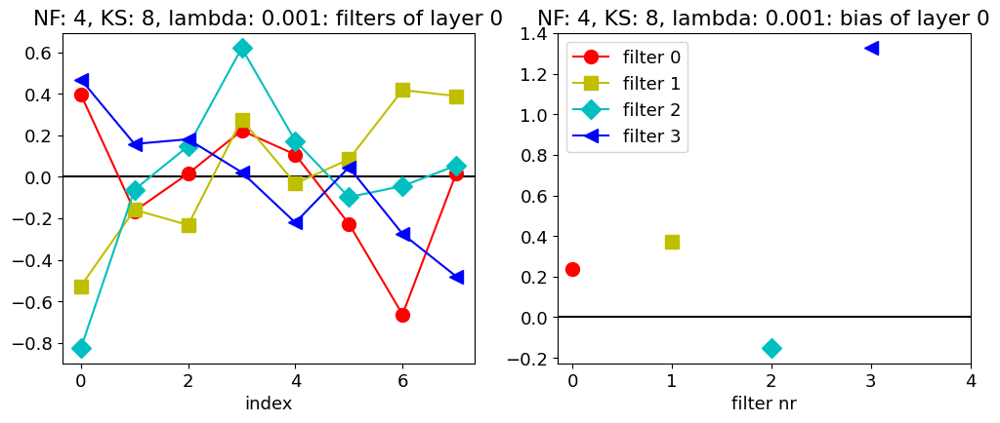

4 8 0.01 0.33375000953674316


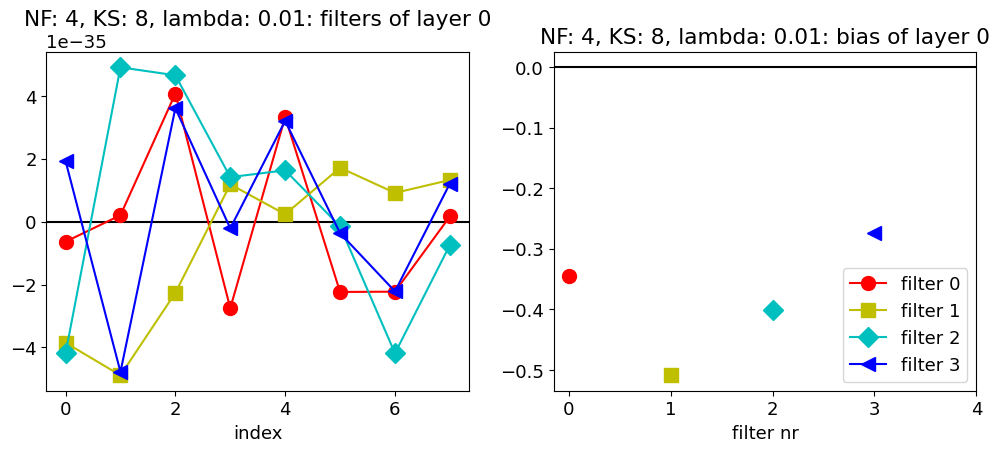

5 4 0 0.6837499737739563


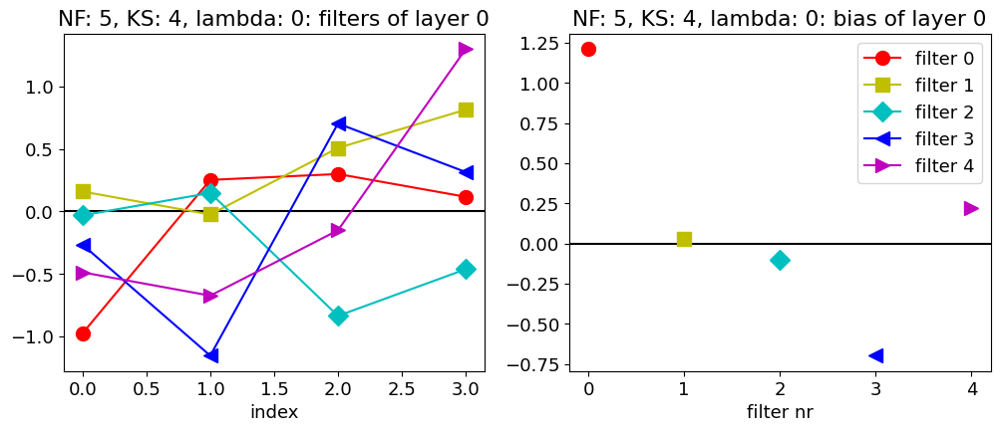

5 4 1e-05 0.7112500071525574


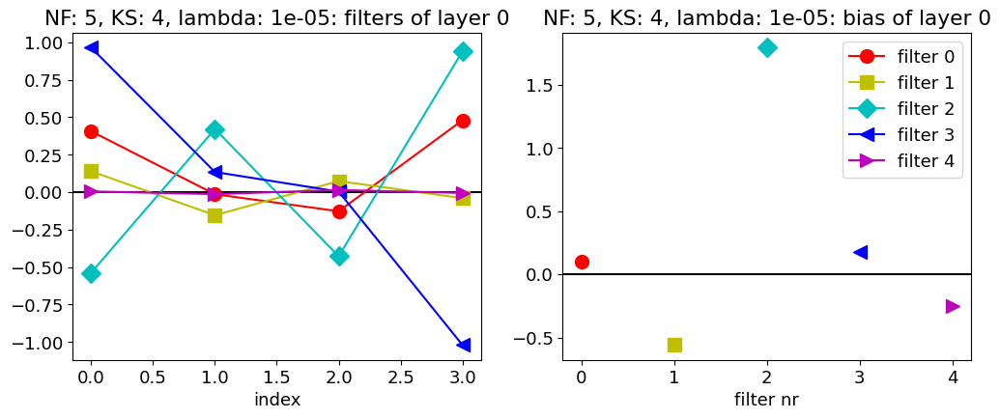

5 4 0.0001 0.6800000071525574


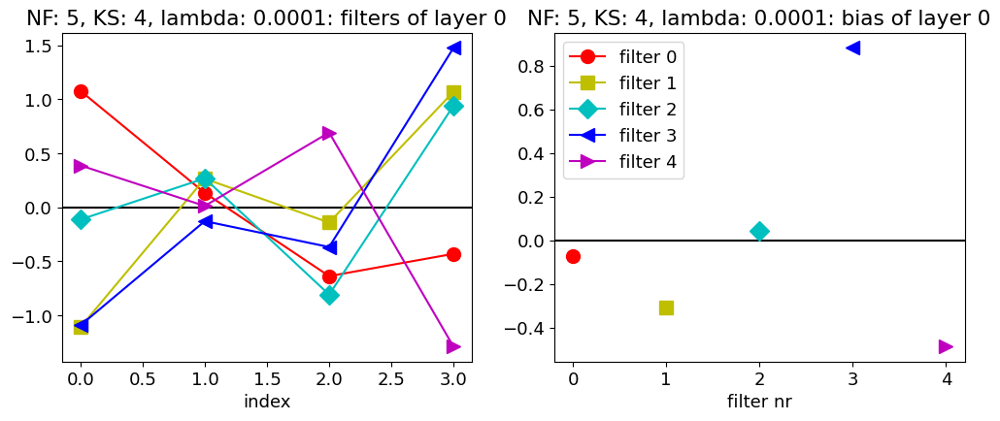

5 4 0.001 0.6537500023841858


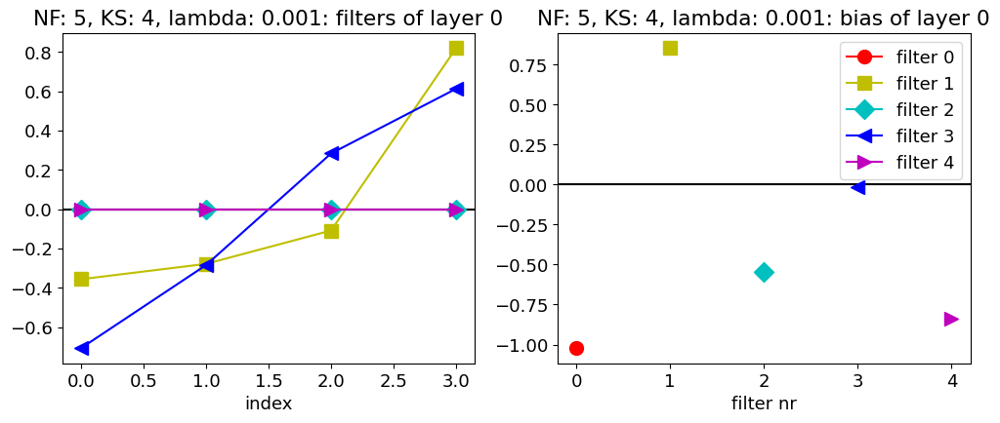

5 4 0.01 0.33375000953674316


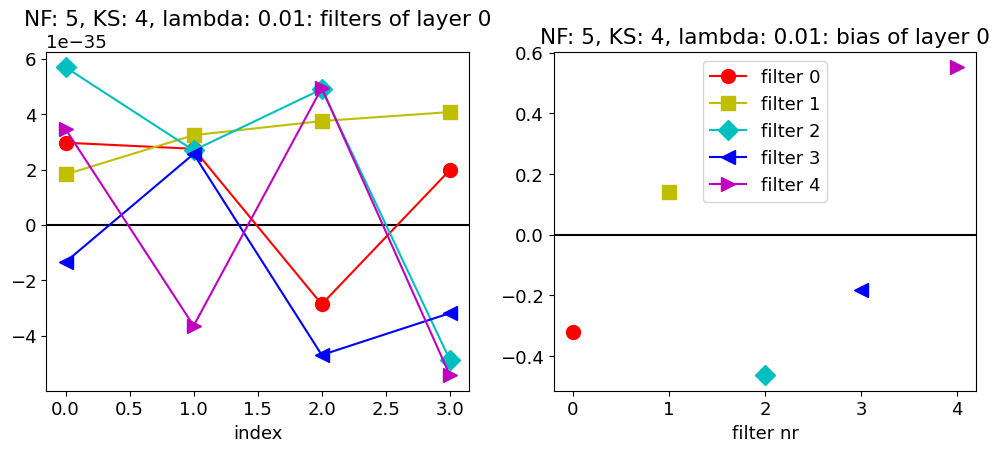

5 5 0 0.731249988079071


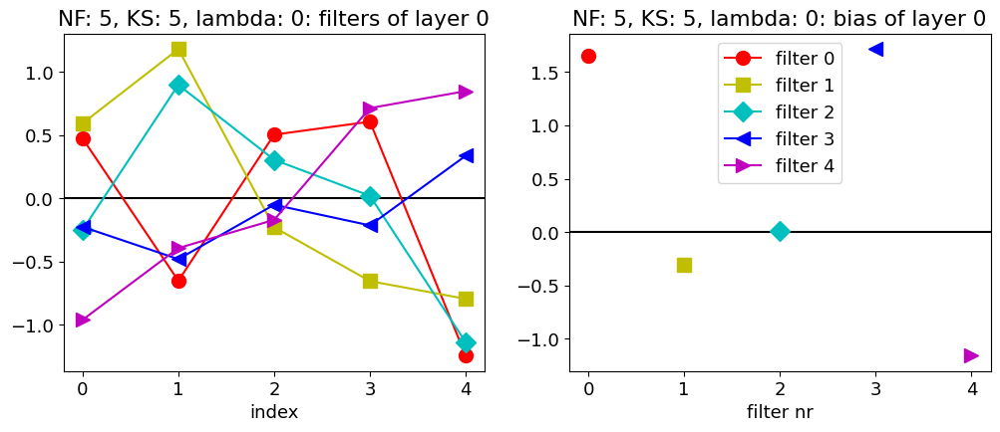

5 5 1e-05 0.33375000953674316


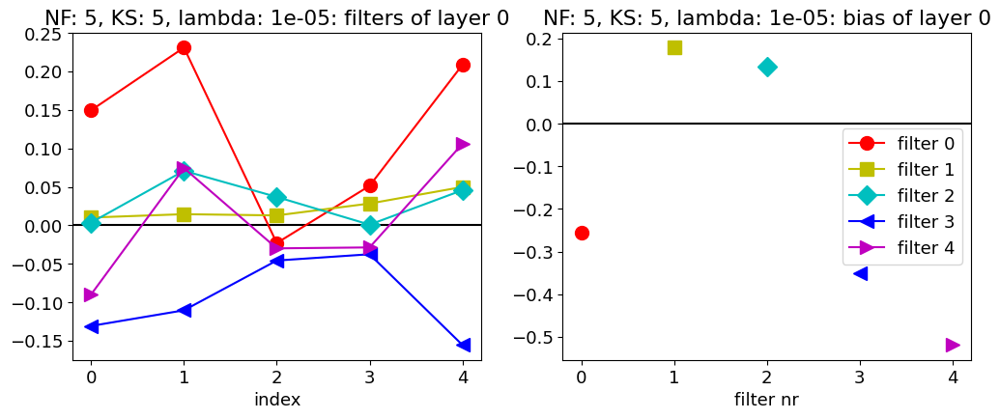

5 5 0.0001 0.675000011920929


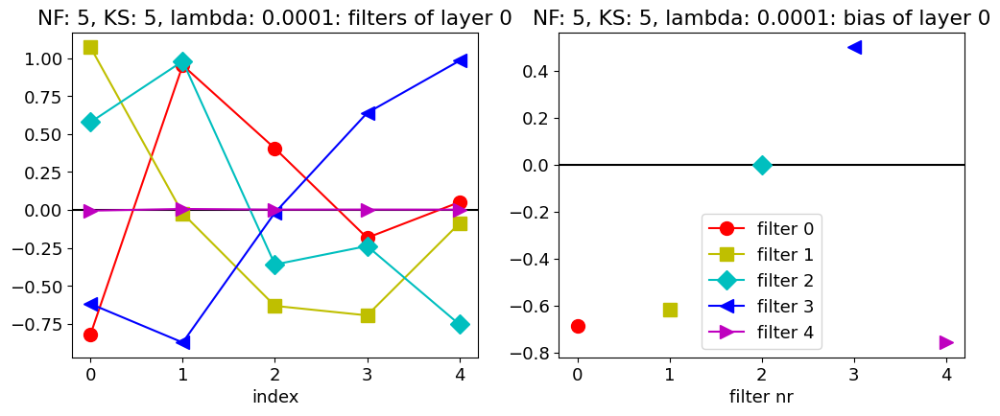

5 5 0.001 0.7237499952316284


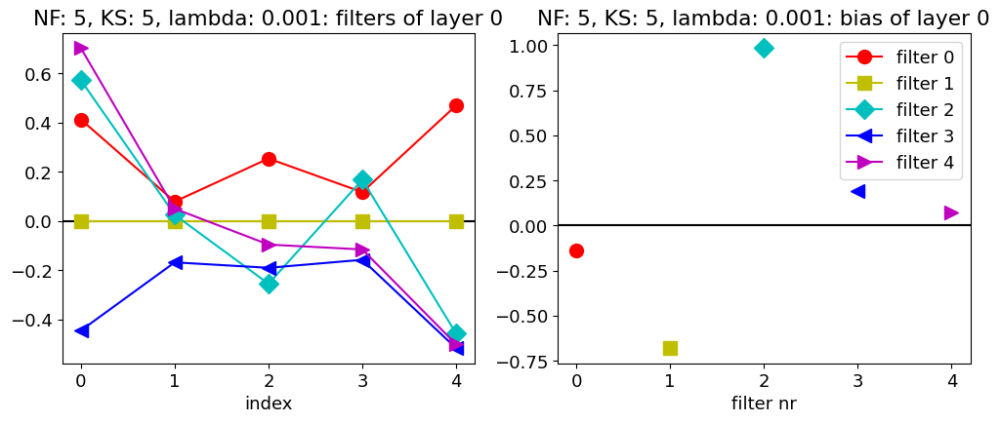

5 5 0.01 0.33375000953674316


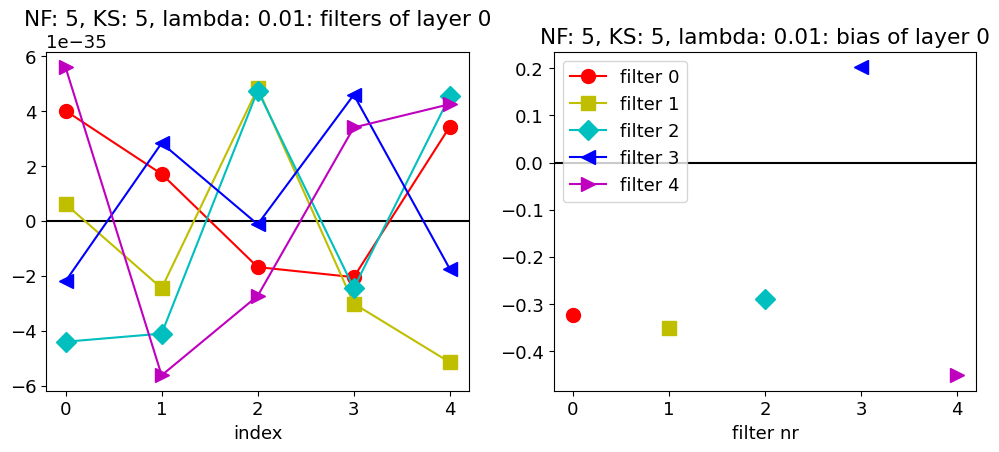

5 6 0 0.33375000953674316


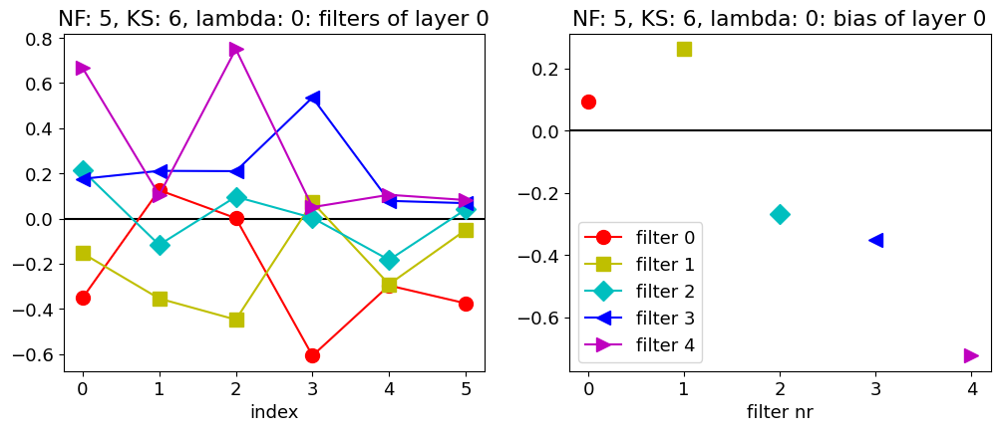

5 6 1e-05 0.7612500190734863


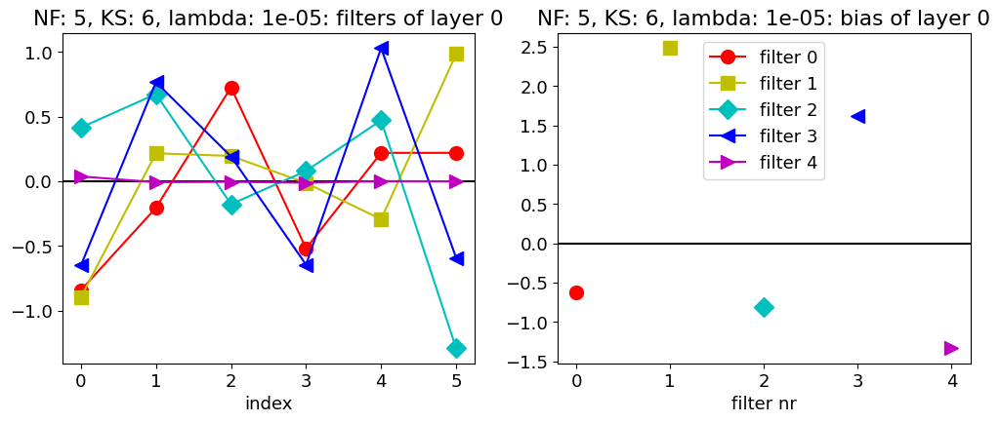

5 6 0.0001 0.33375000953674316


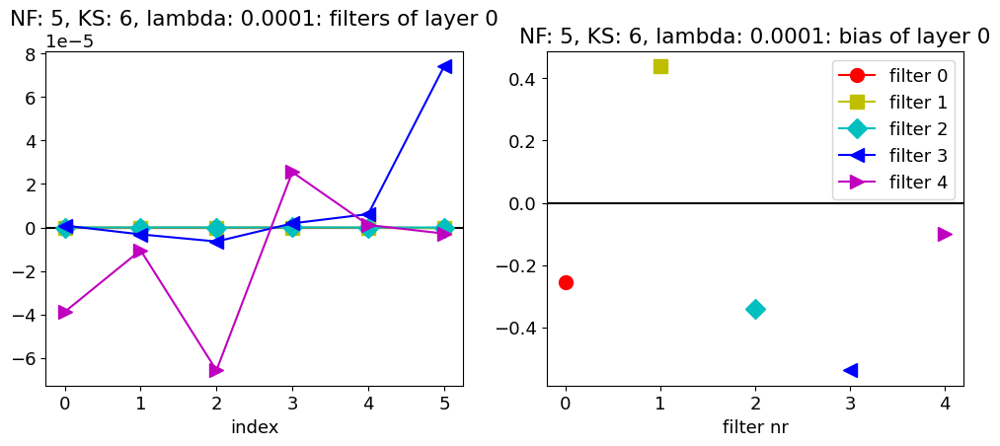

5 6 0.001 0.33375000953674316


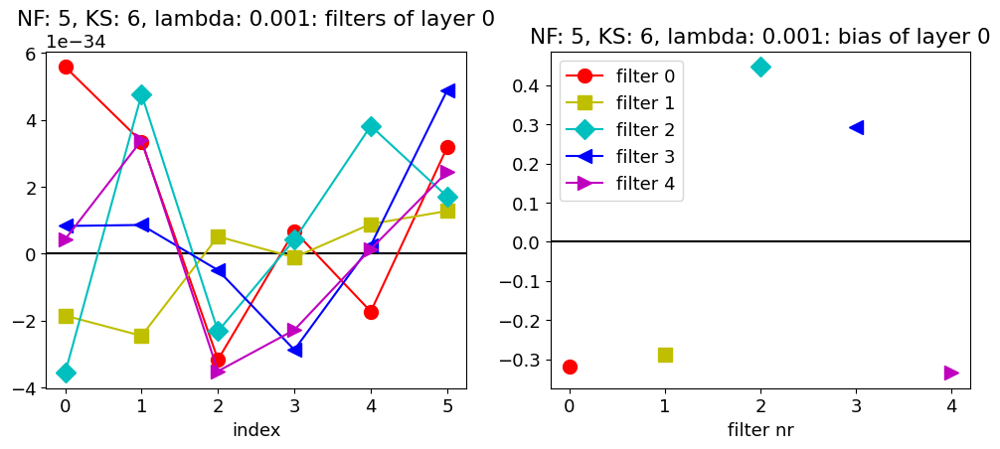

5 6 0.01 0.33375000953674316


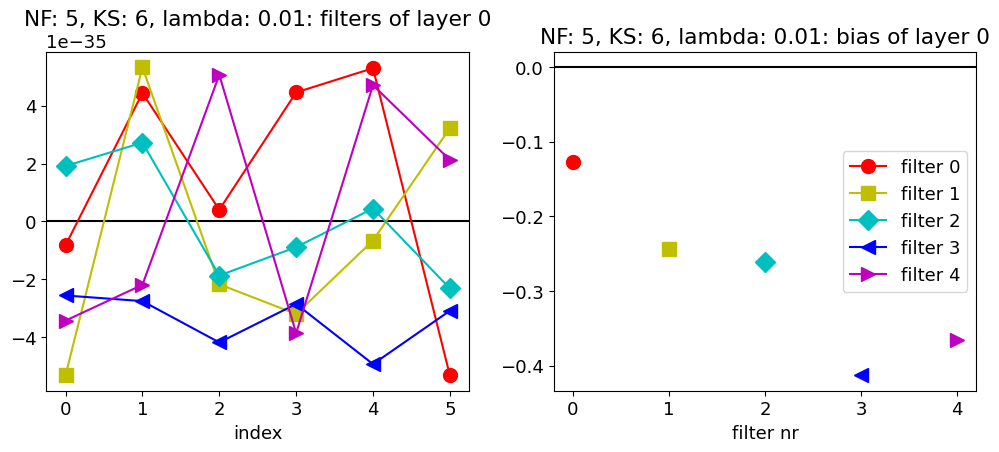

5 7 0 0.7787500023841858


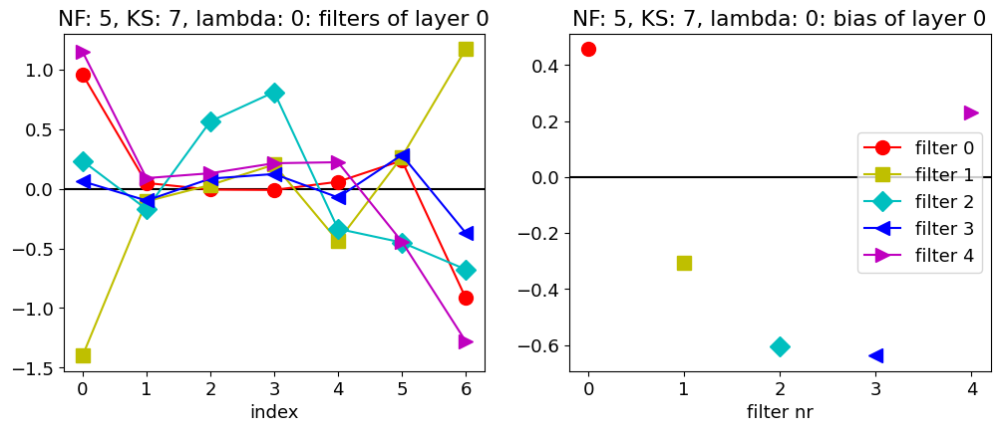

5 7 1e-05 0.59375


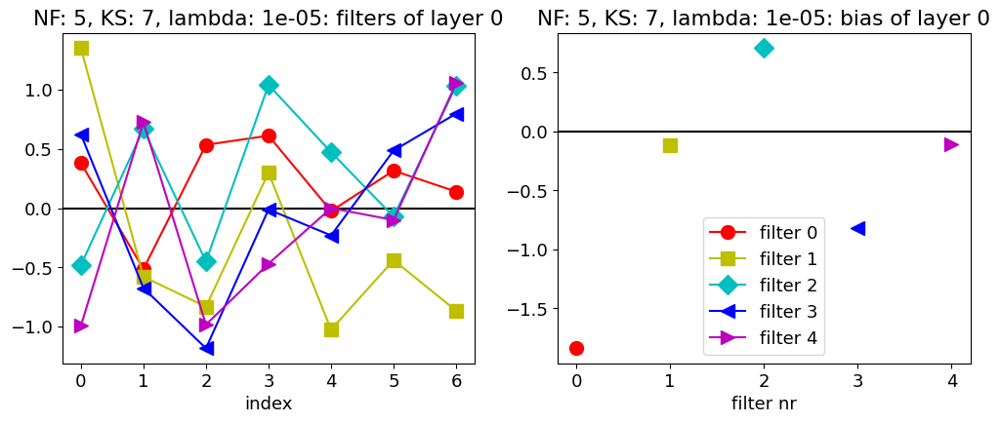

5 7 0.0001 0.6862499713897705


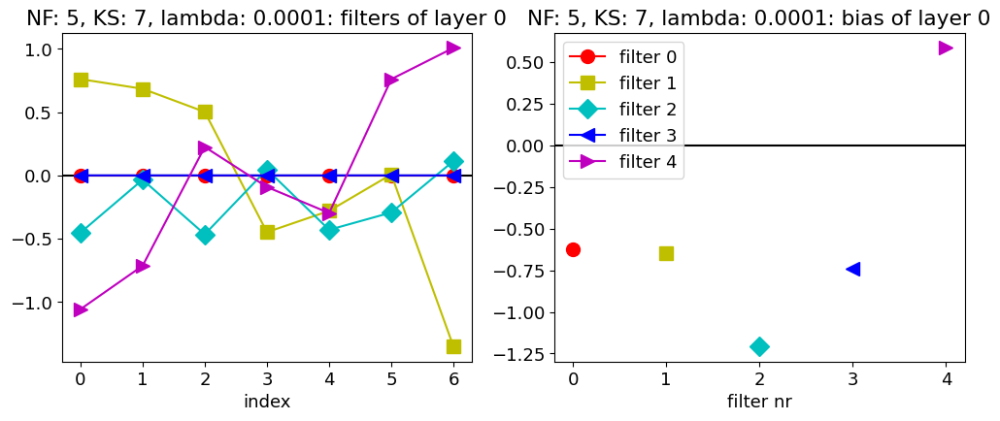

5 7 0.001 0.7850000262260437


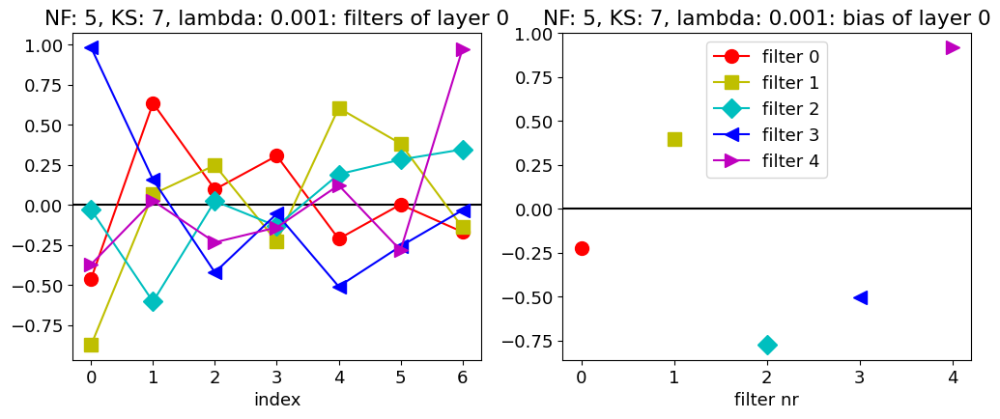

5 7 0.01 0.33375000953674316


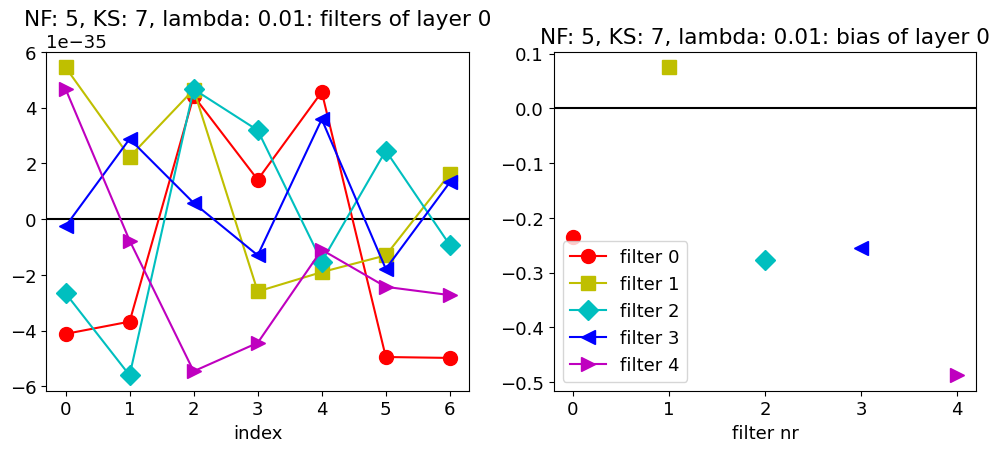

5 8 0 0.6000000238418579


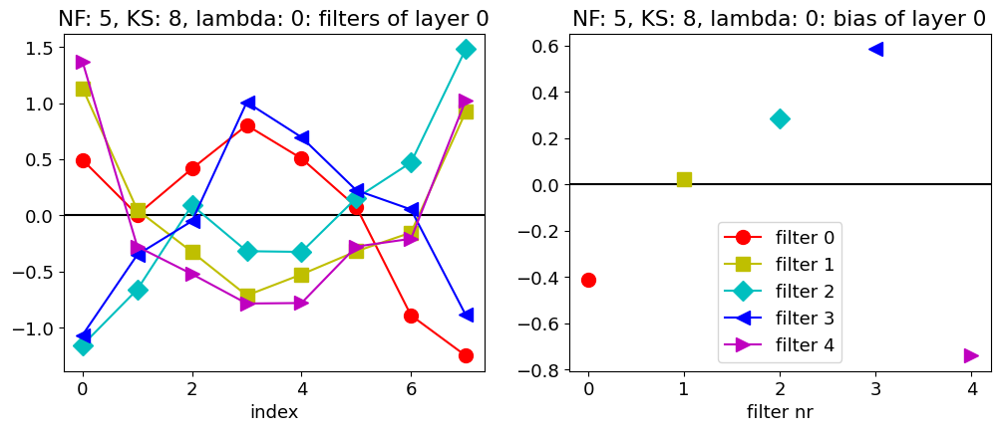

5 8 1e-05 0.768750011920929


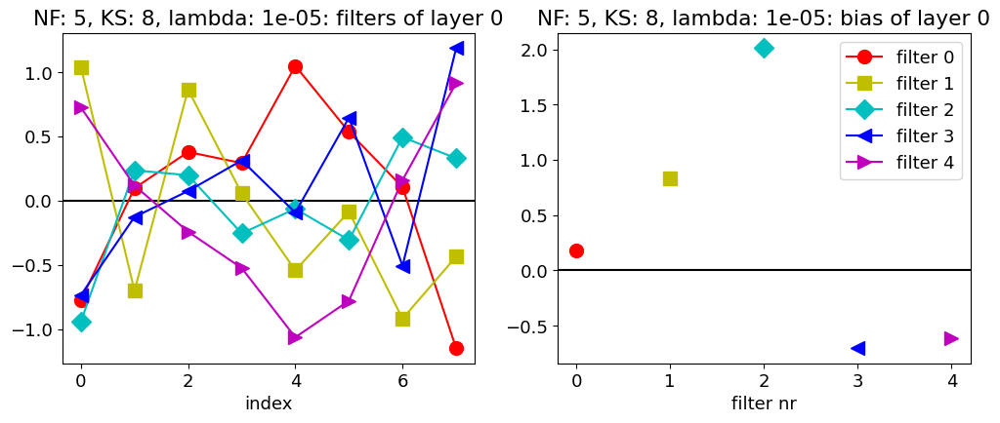

5 8 0.0001 0.643750011920929


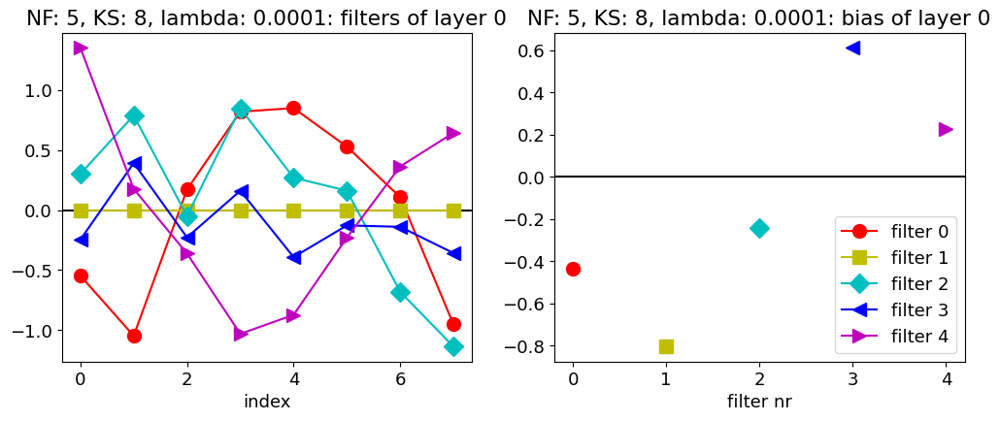

5 8 0.001 0.7737500071525574


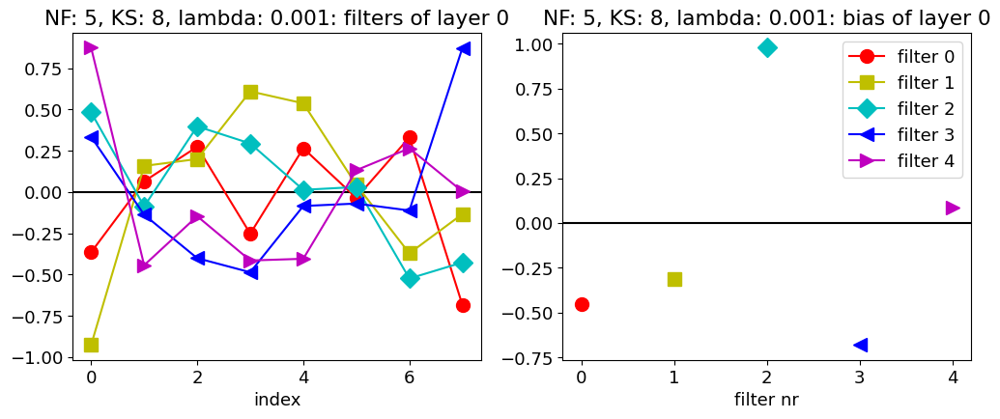

5 8 0.01 0.7862499952316284


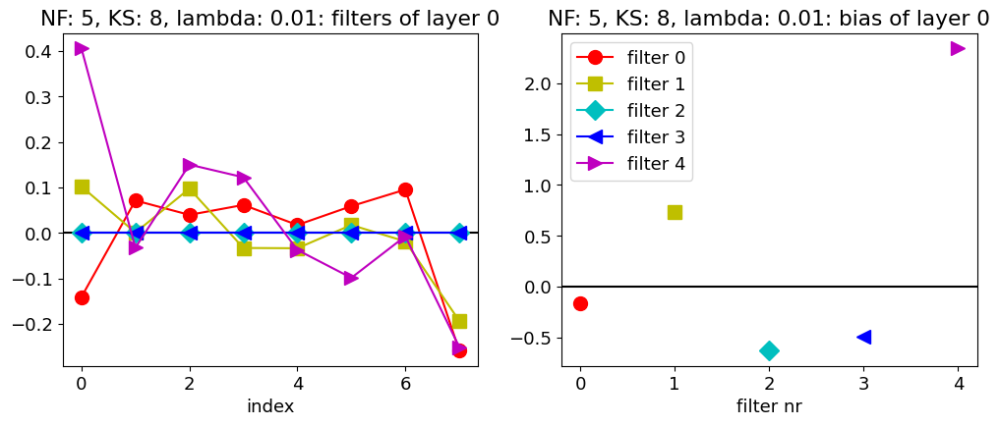

6 4 0 0.7012500166893005


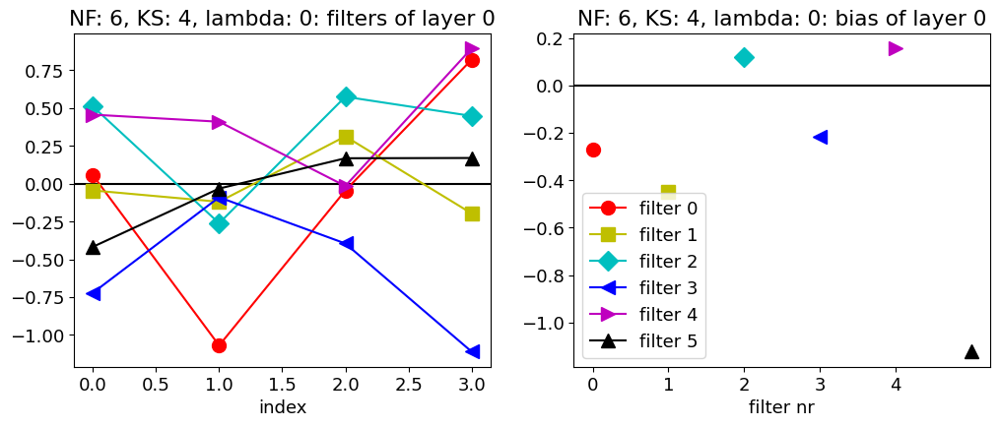

6 4 1e-05 0.6825000047683716


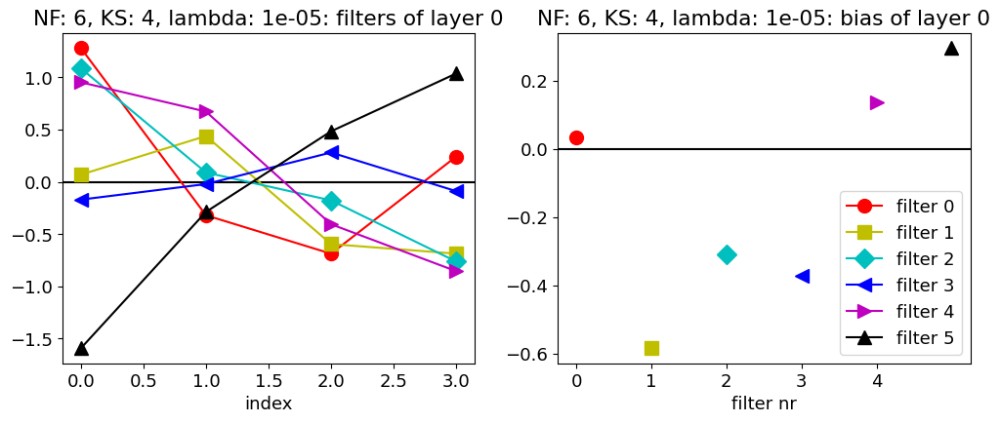

6 4 0.0001 0.33375000953674316


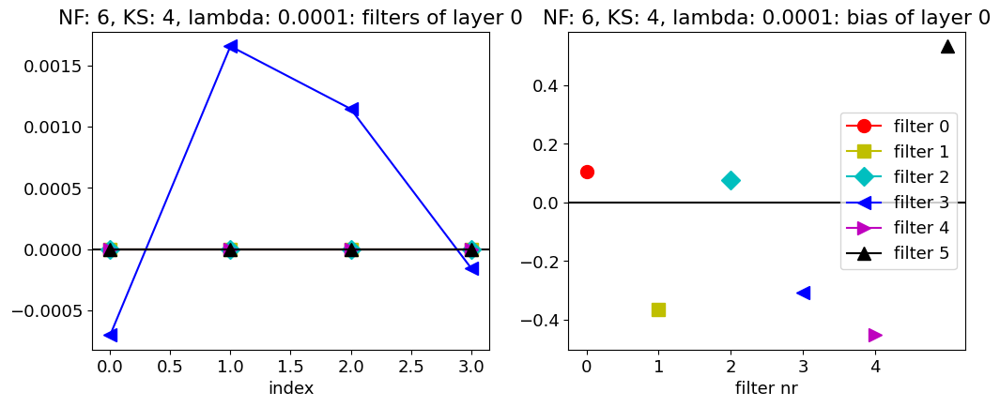

6 4 0.001 0.33375000953674316


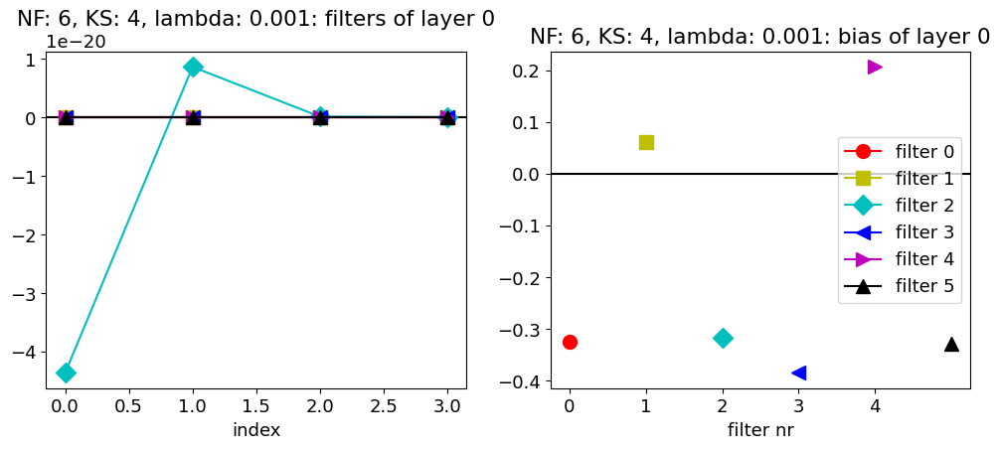

6 4 0.01 0.33375000953674316


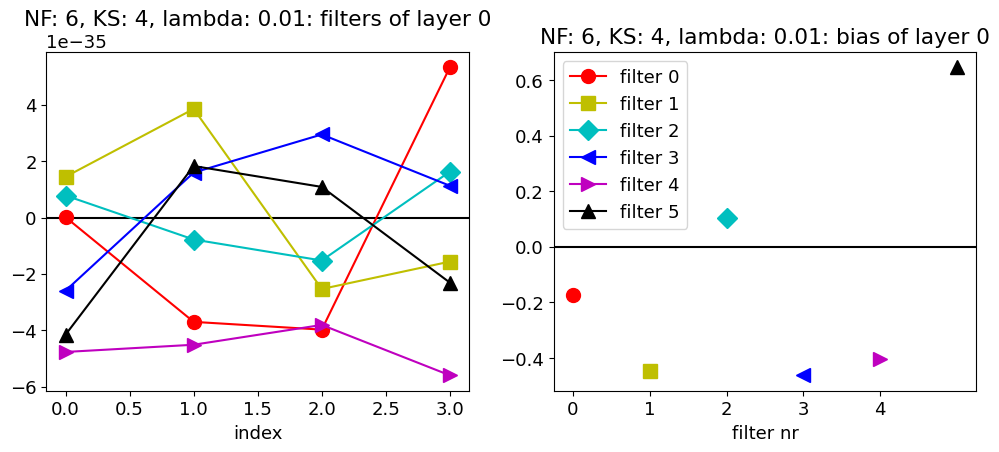

6 5 0 0.7024999856948853


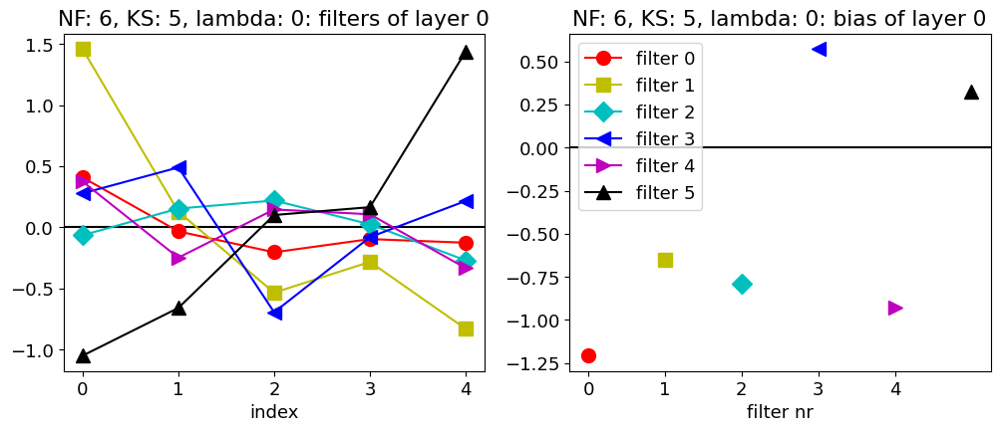

6 5 1e-05 0.33375000953674316


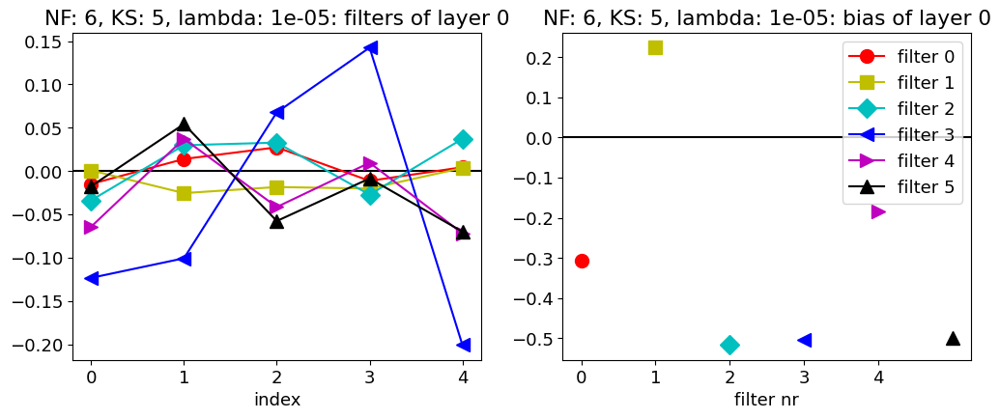

6 5 0.0001 0.6837499737739563


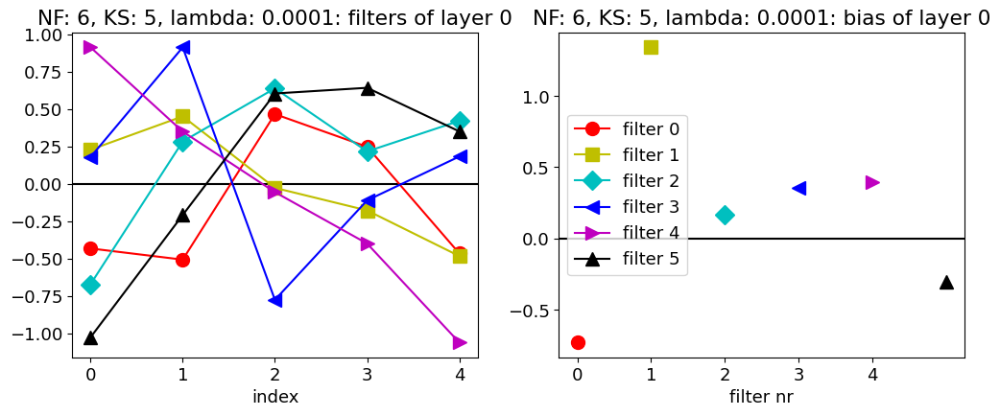

6 5 0.001 0.33375000953674316


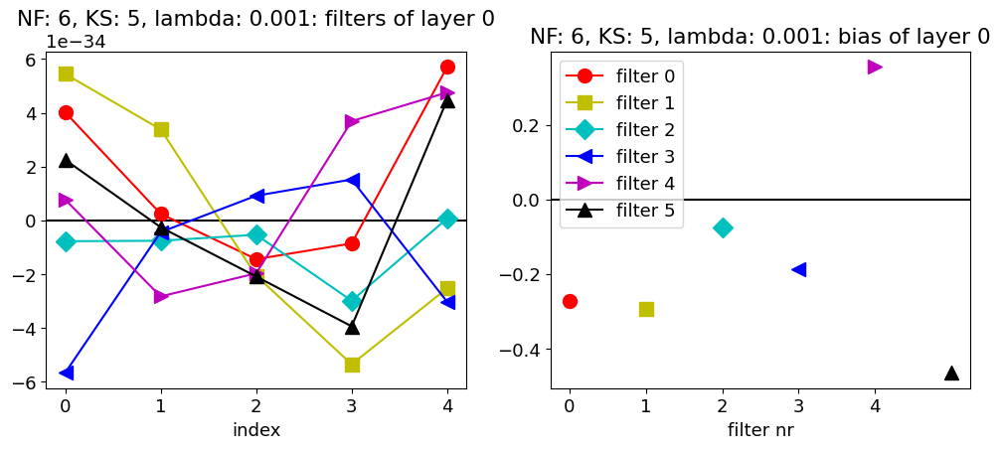

6 5 0.01 0.33375000953674316


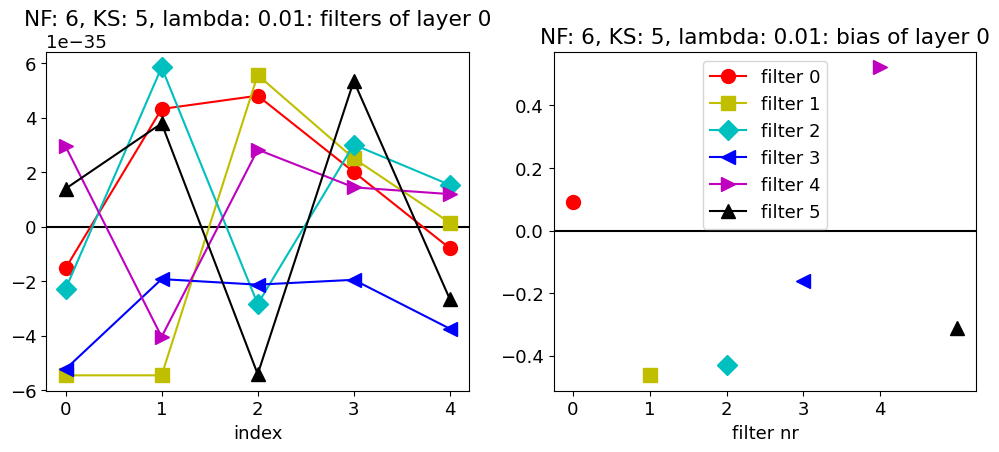

6 6 0 0.33375000953674316


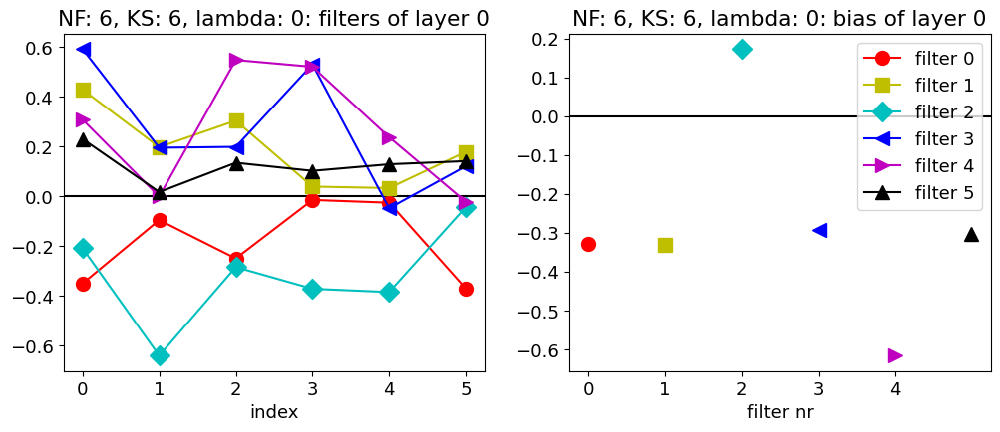

6 6 1e-05 0.7250000238418579


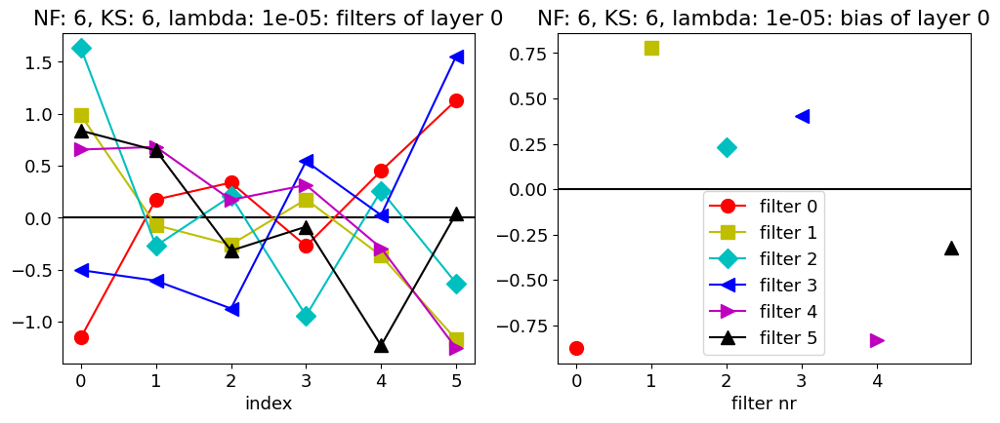

6 6 0.0001 0.33375000953674316


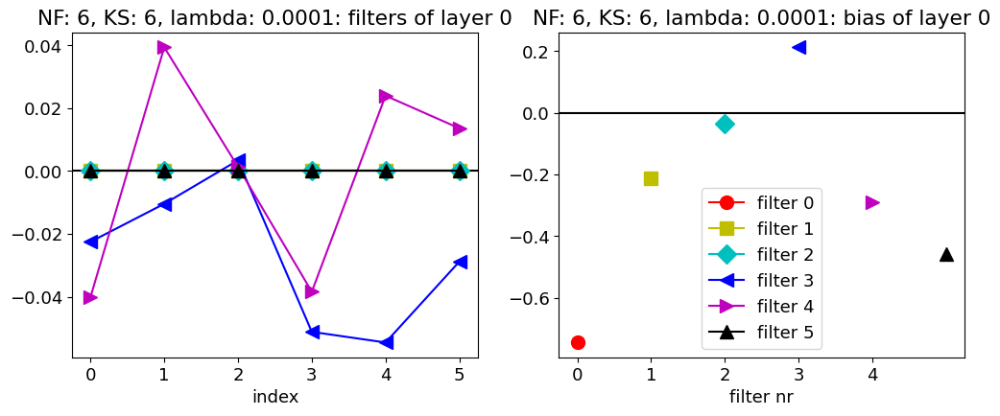

6 6 0.001 0.33375000953674316


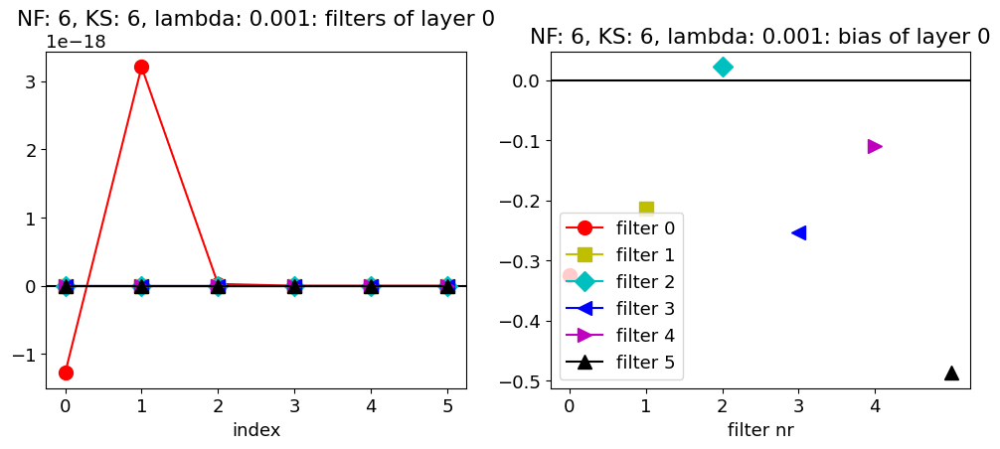

6 6 0.01 0.33375000953674316


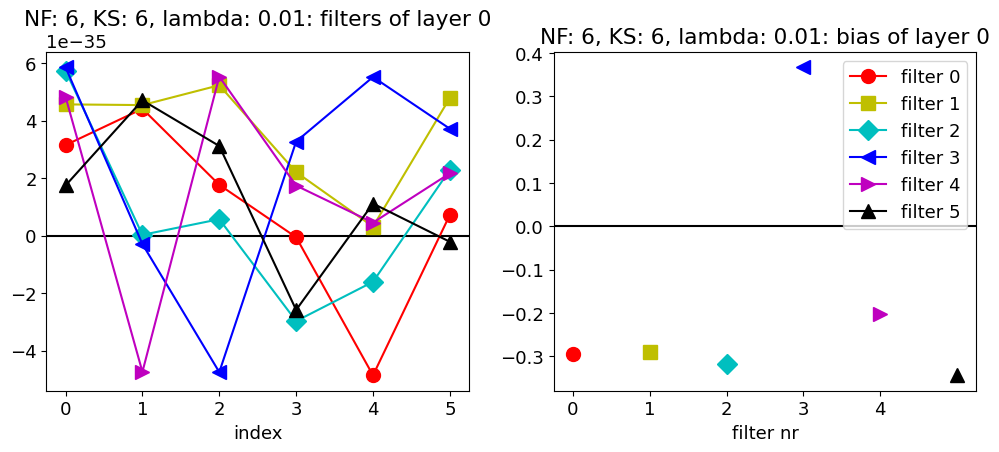

6 7 0 0.78125


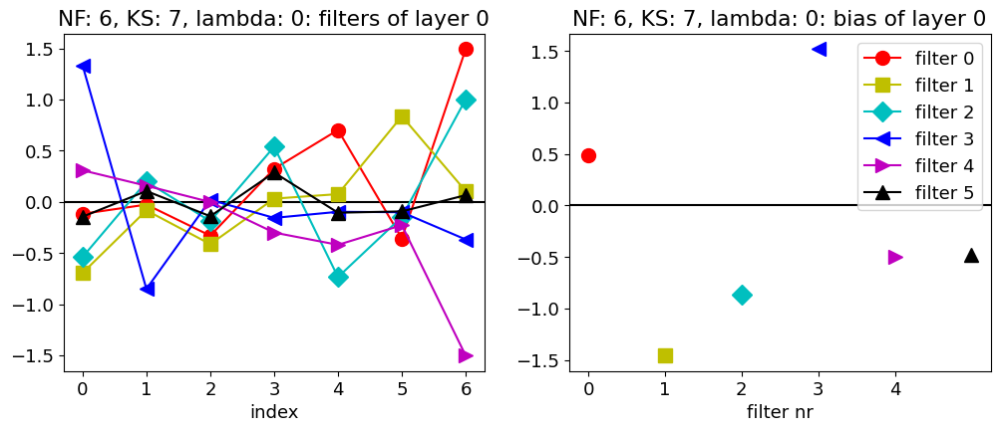

6 7 1e-05 0.7724999785423279


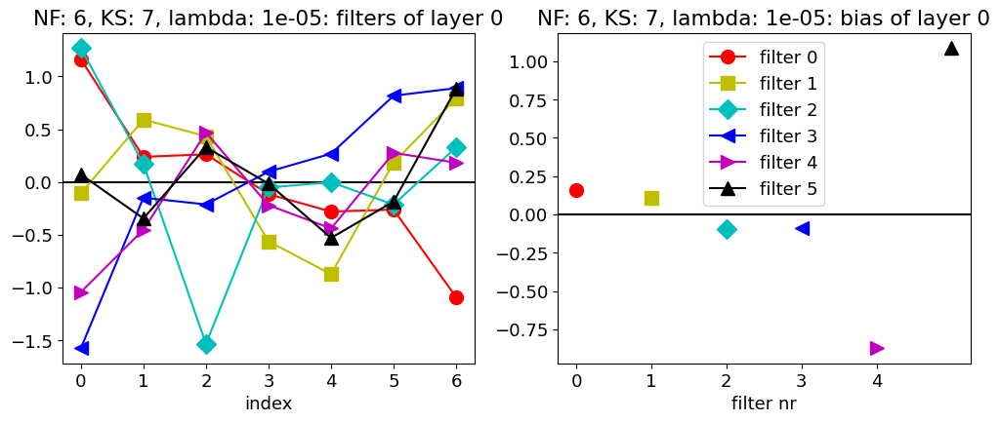

6 7 0.0001 0.33375000953674316


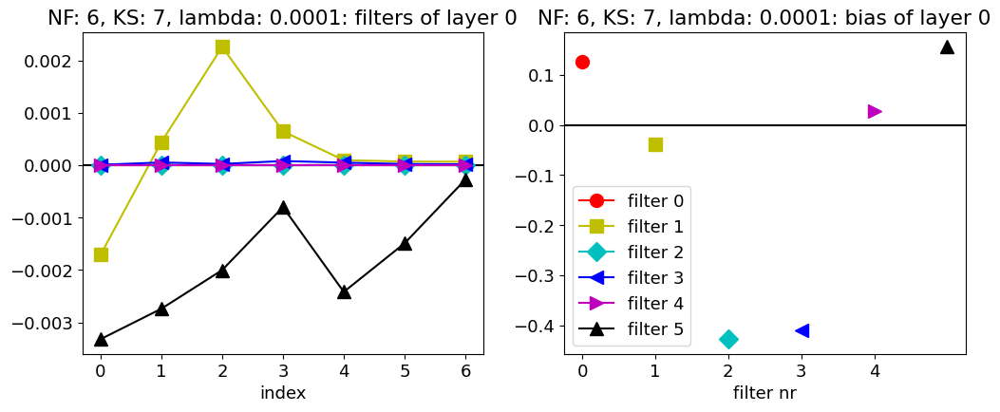

6 7 0.001 0.33375000953674316


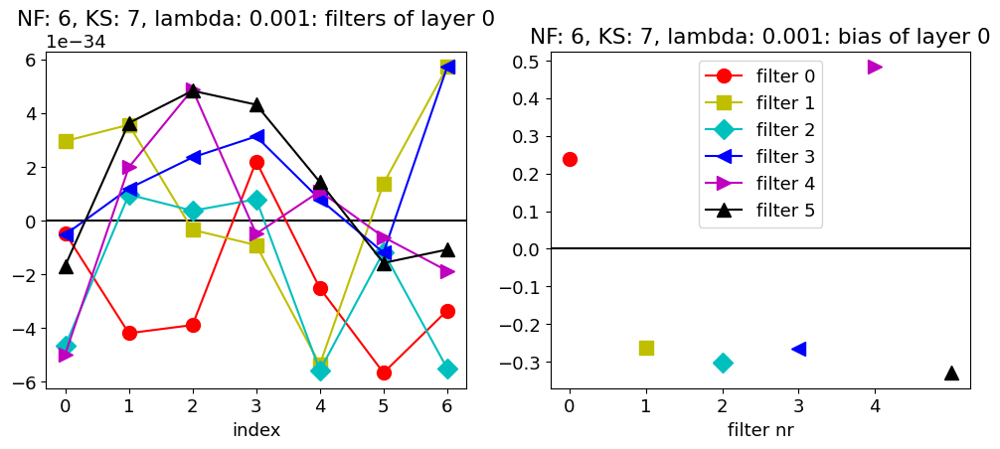

6 7 0.01 0.33375000953674316


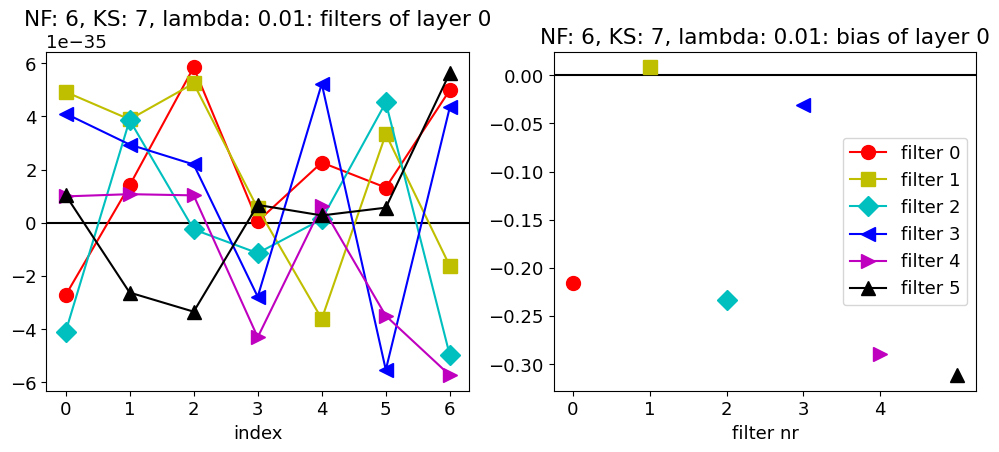

6 8 0 0.7537500262260437


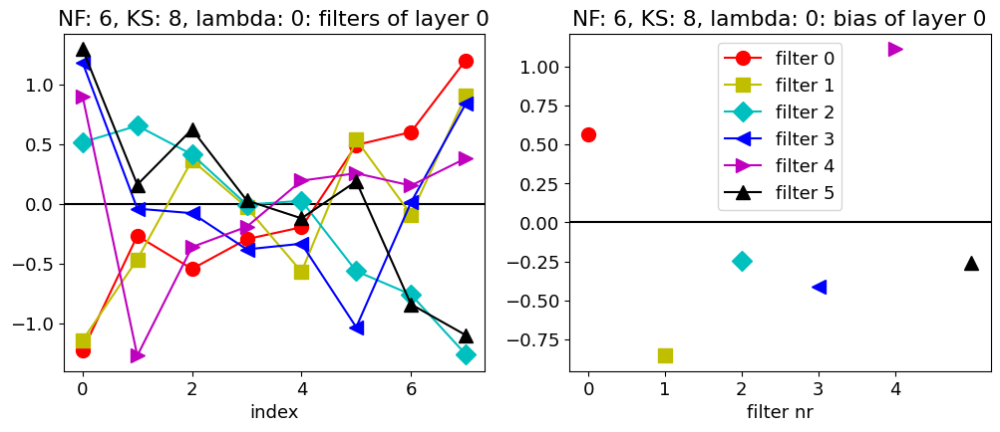

6 8 1e-05 0.7925000190734863


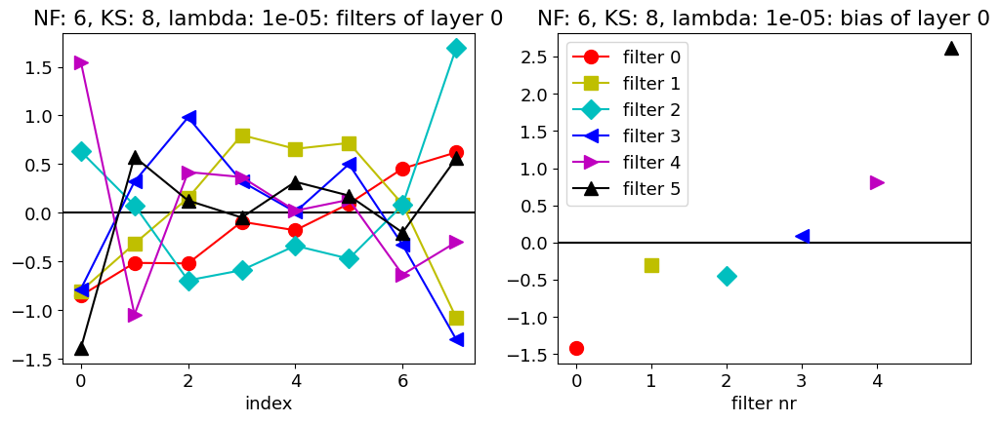

6 8 0.0001 0.6549999713897705


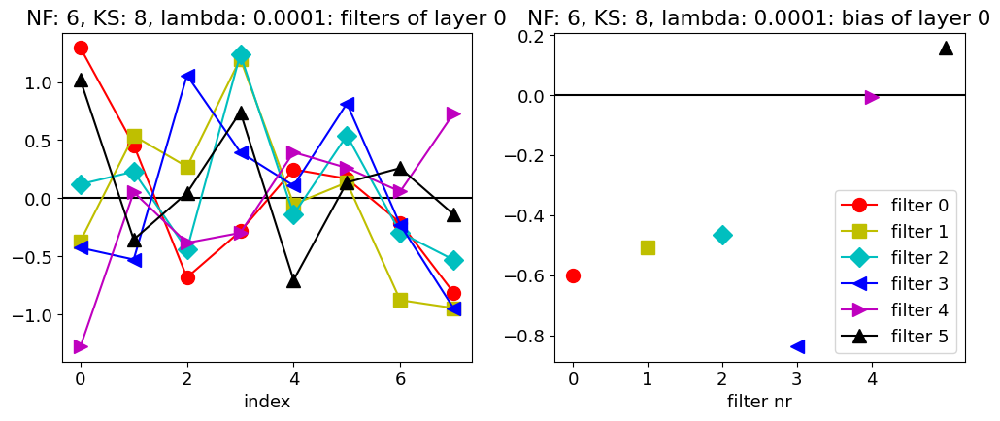

6 8 0.001 0.33375000953674316


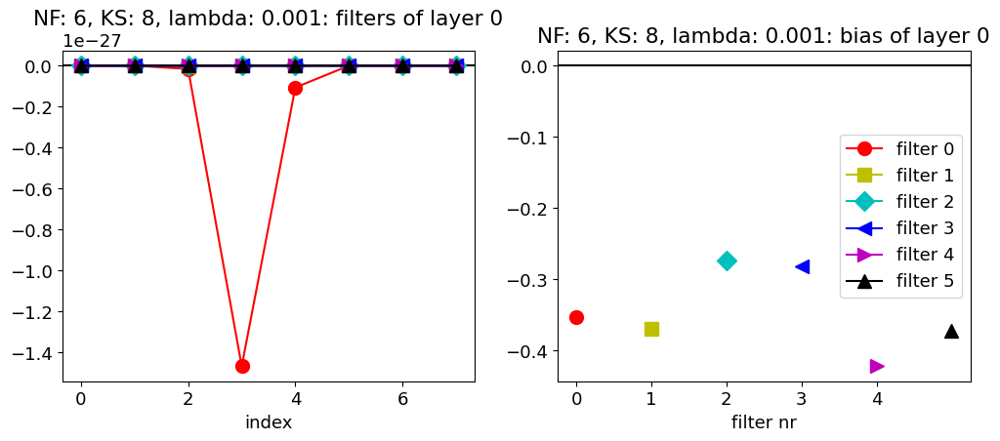

6 8 0.01 0.7950000166893005


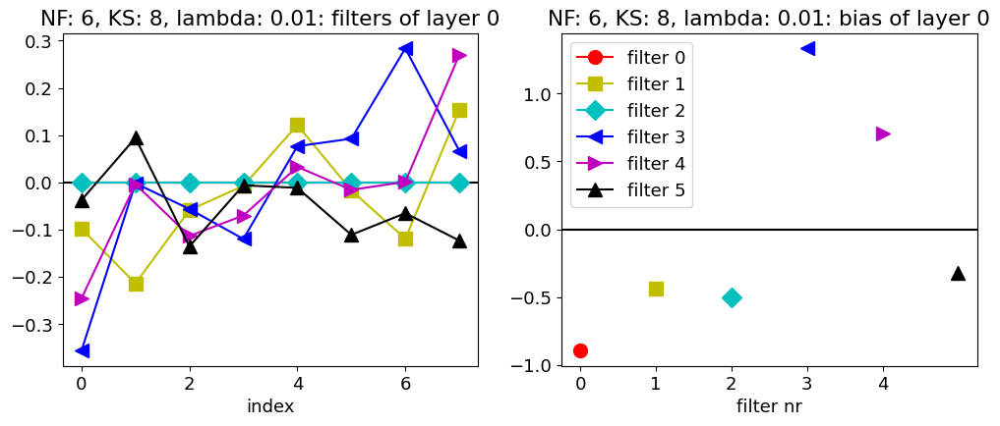

7 4 0 0.7012500166893005


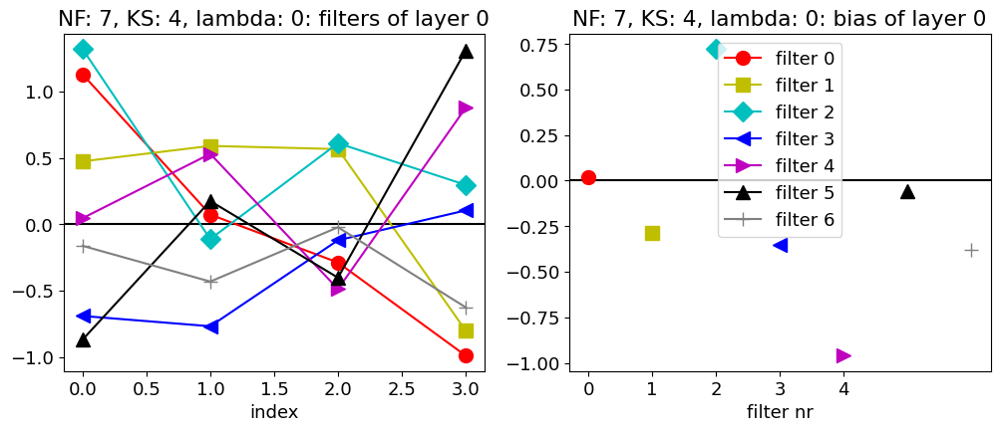

7 4 1e-05 0.33375000953674316


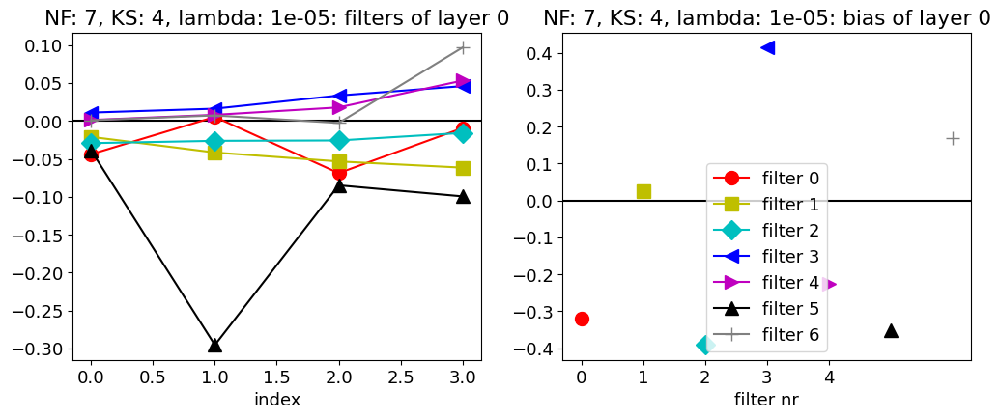

7 4 0.0001 0.7112500071525574


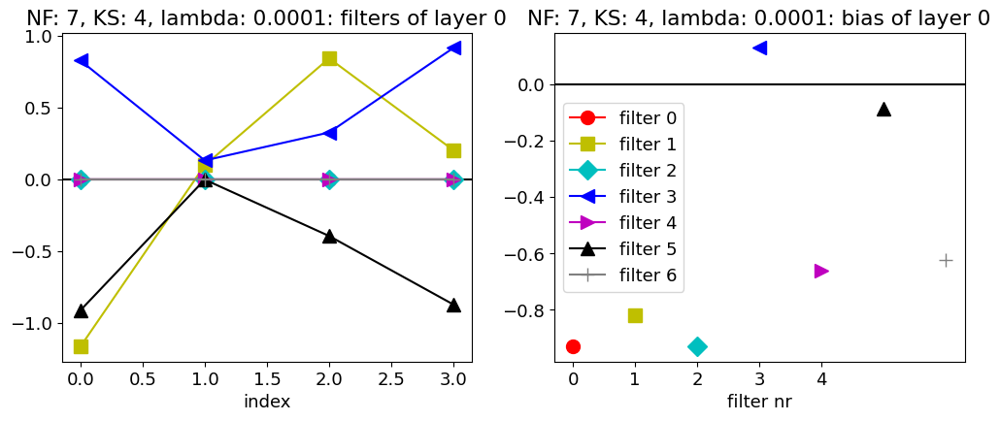

7 4 0.001 0.6937500238418579


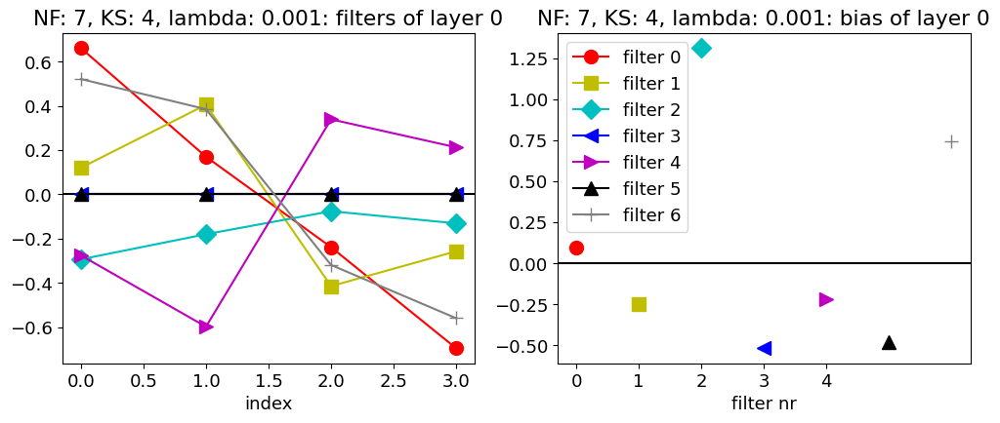

7 4 0.01 0.6662499904632568


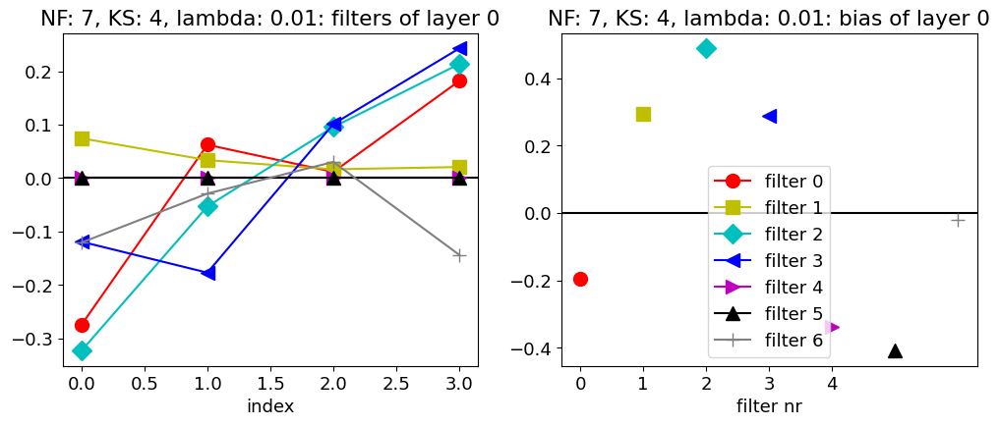

7 5 0 0.33375000953674316


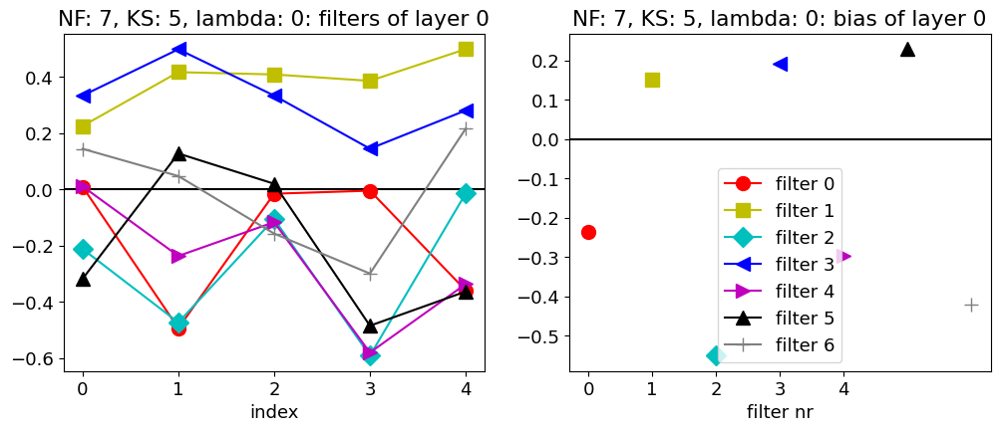

7 5 1e-05 0.6812499761581421


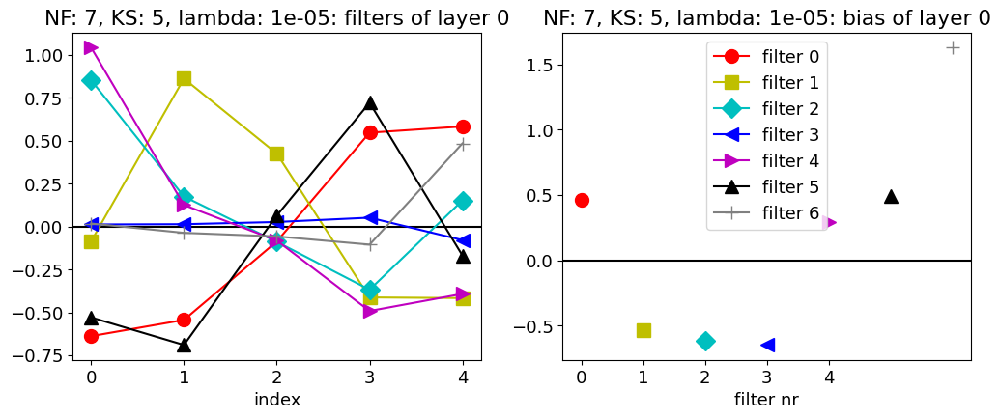

7 5 0.0001 0.33375000953674316


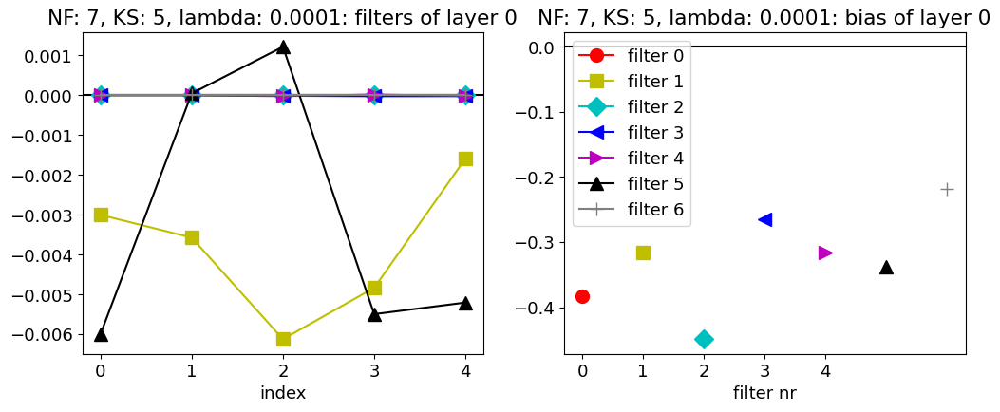

7 5 0.001 0.7049999833106995


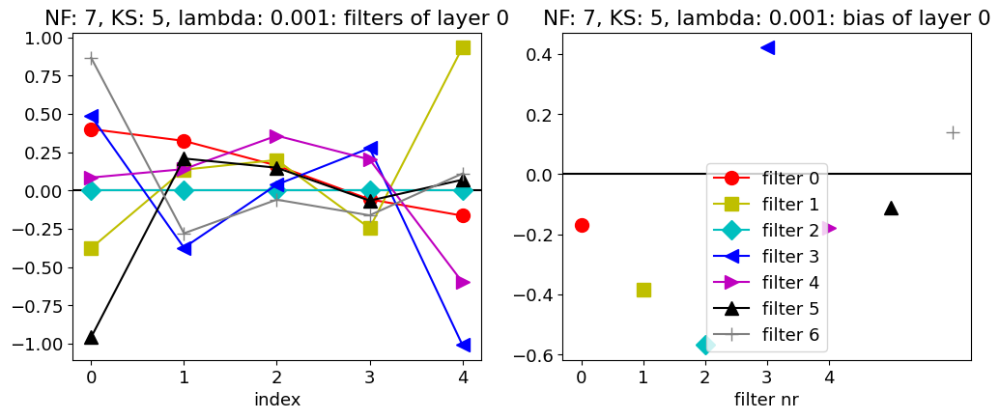

7 5 0.01 0.33375000953674316


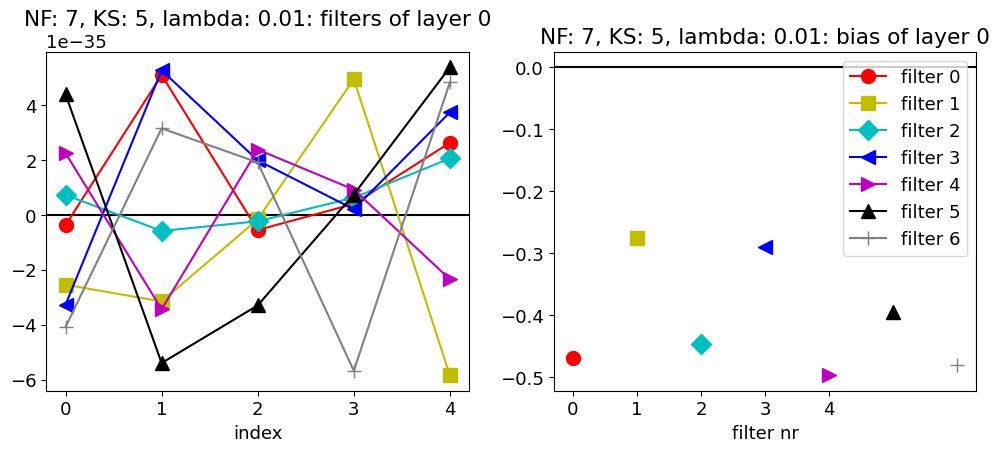

7 6 0 0.7674999833106995


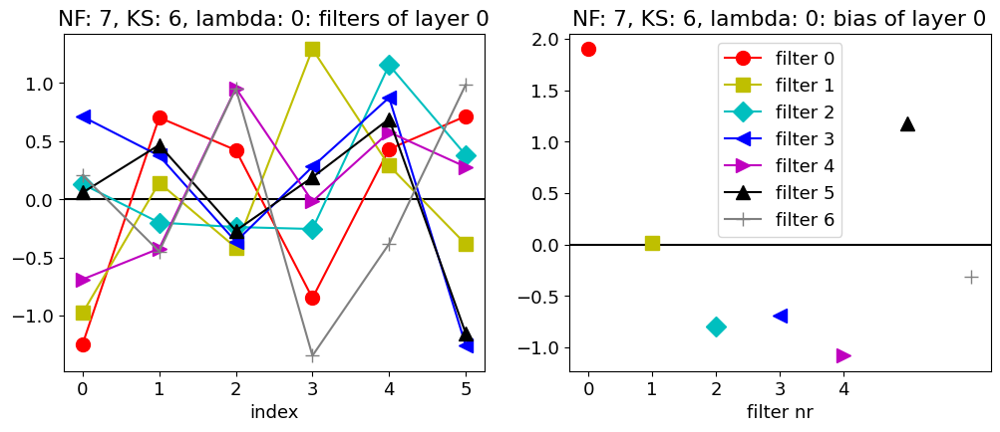

7 6 1e-05 0.33375000953674316


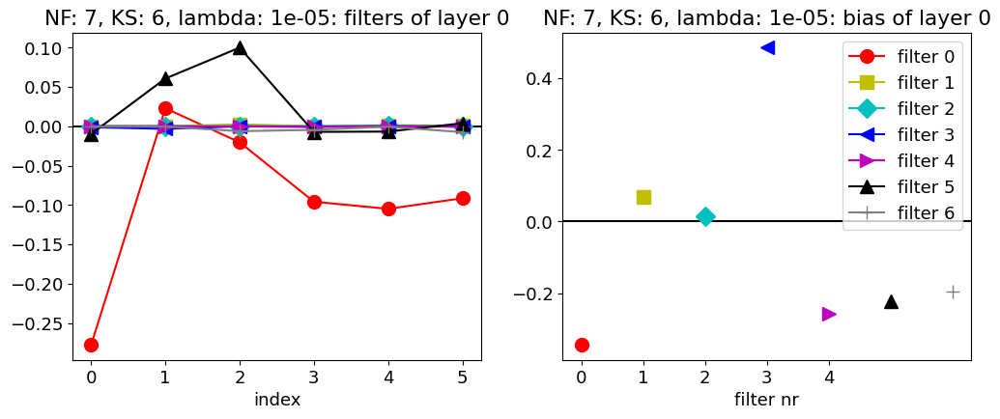

7 6 0.0001 0.6850000023841858


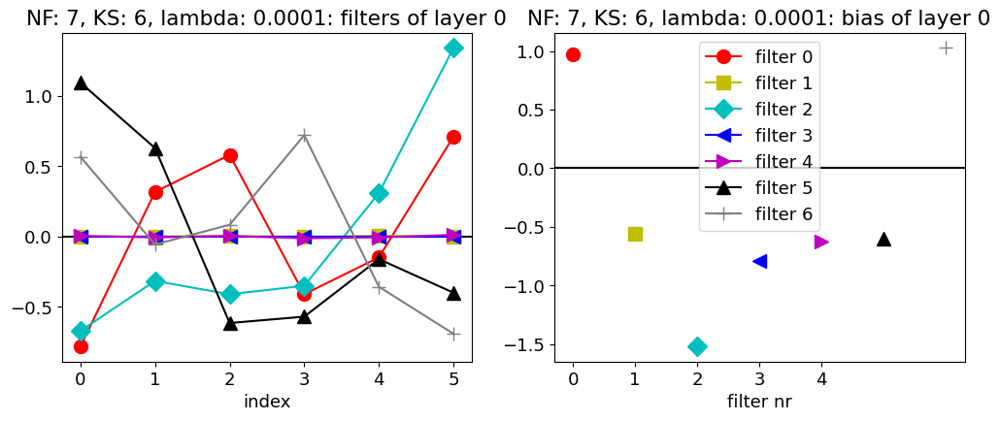

7 6 0.001 0.33375000953674316


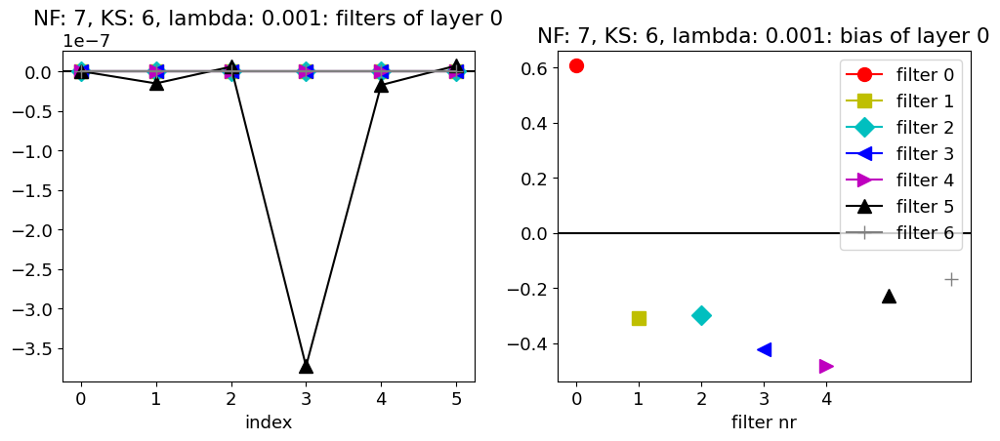

7 6 0.01 0.33375000953674316


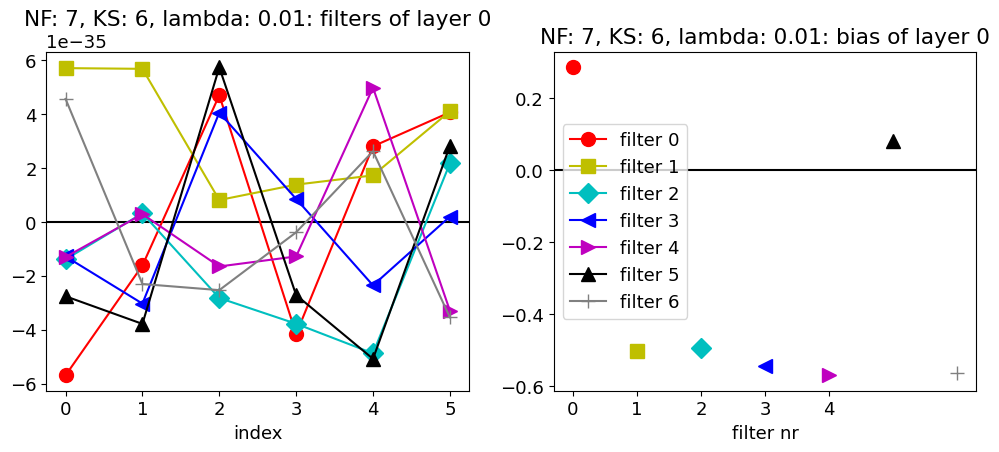

7 7 0 0.7450000047683716


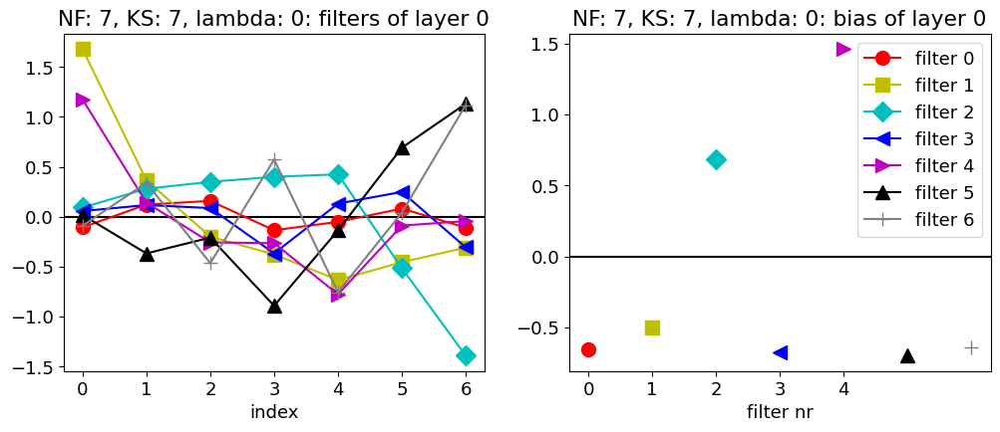

7 7 1e-05 0.7799999713897705


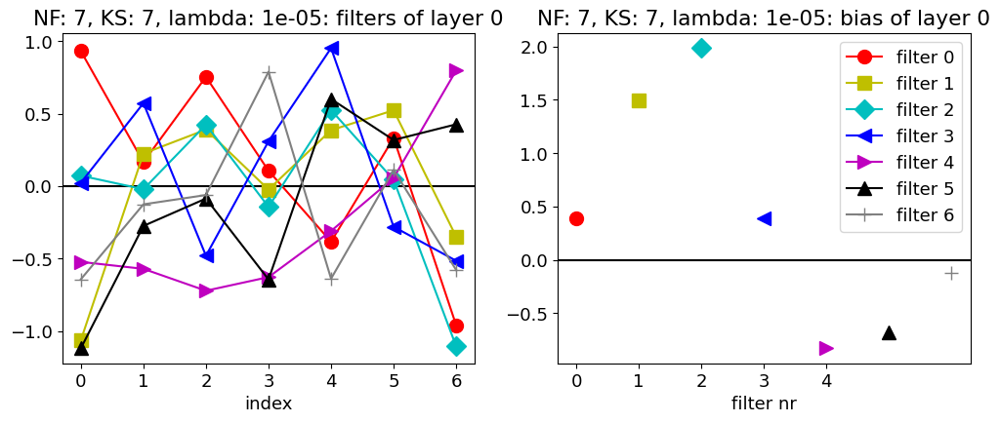

7 7 0.0001 0.7762500047683716


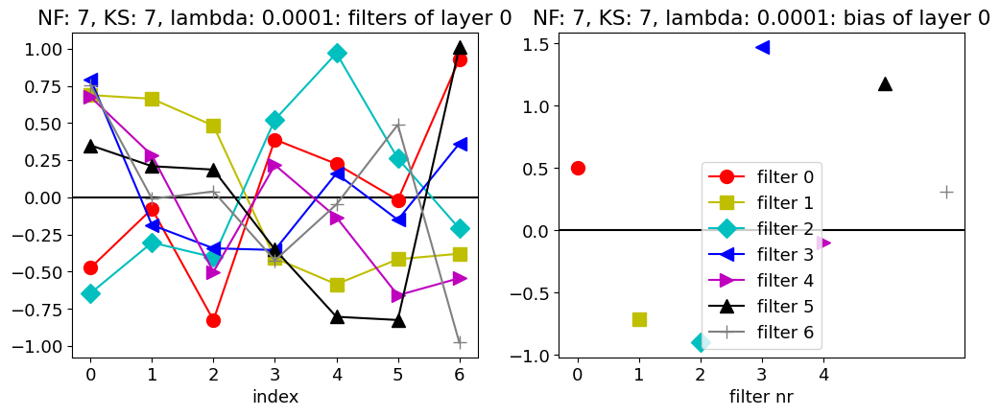

7 7 0.001 0.33375000953674316


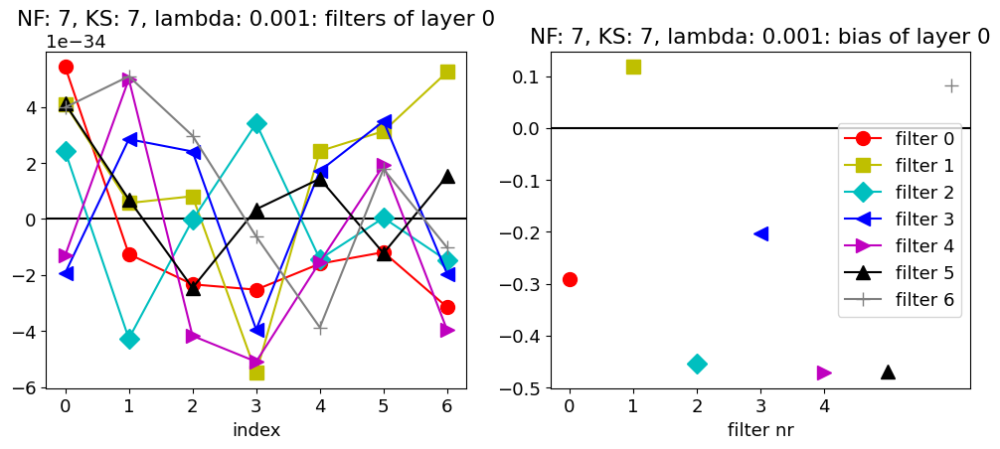

7 7 0.01 0.33375000953674316


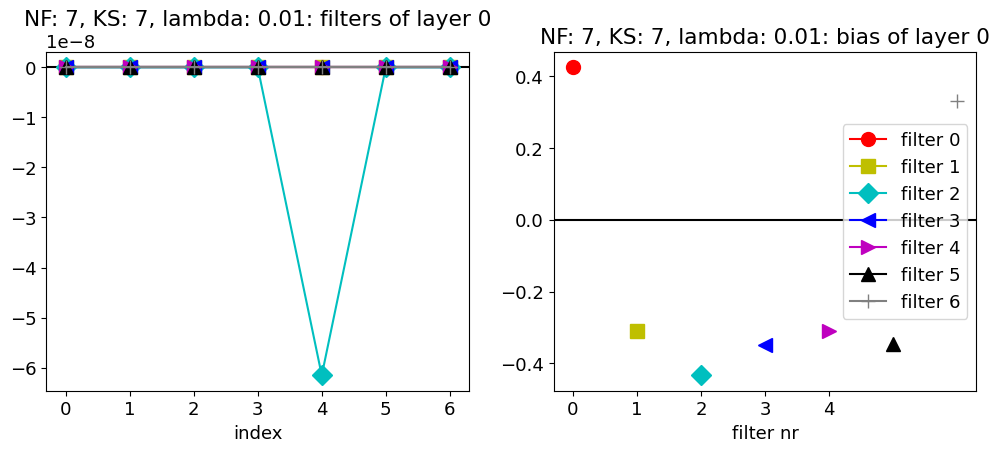

7 8 0 0.6487500071525574


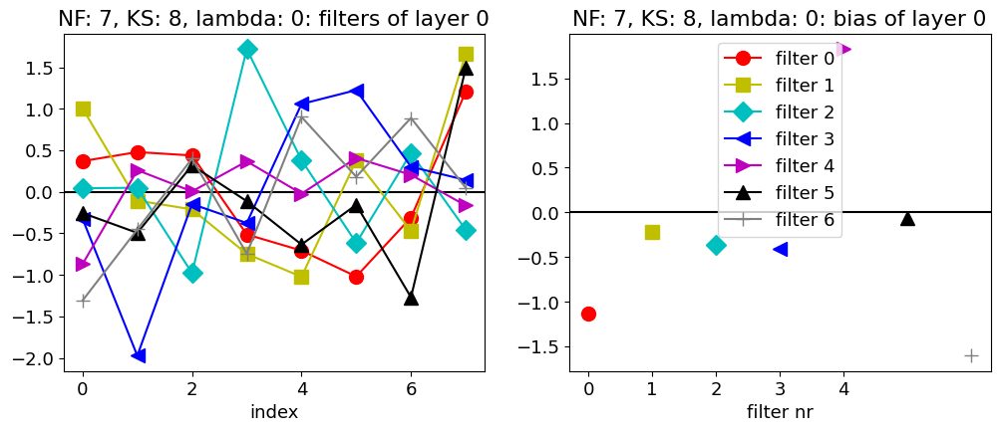

7 8 1e-05 0.7825000286102295


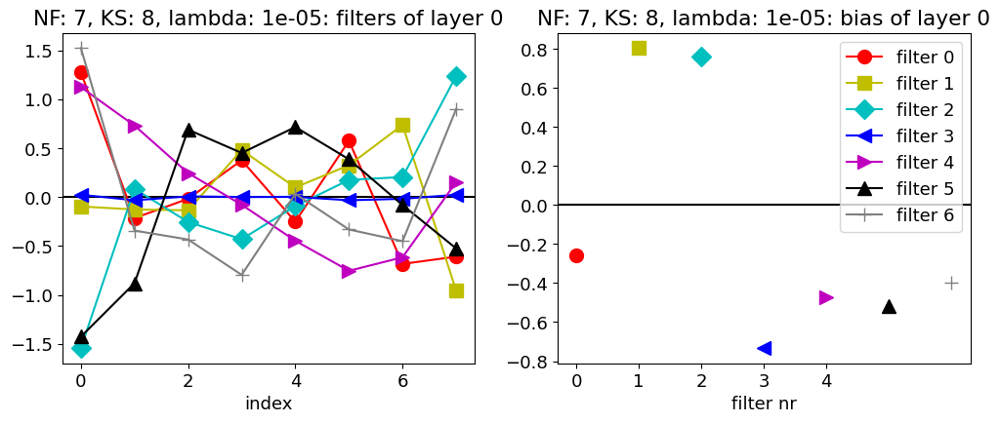

7 8 0.0001 0.7724999785423279


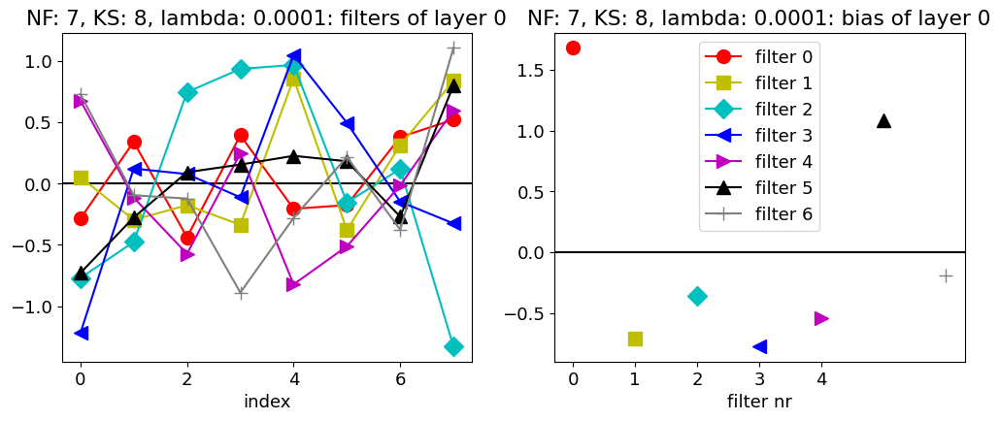

7 8 0.001 0.33375000953674316


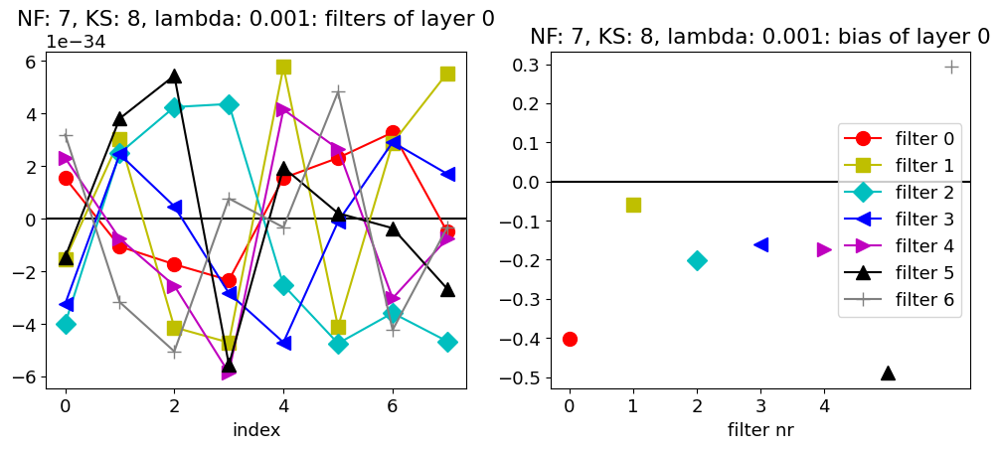

7 8 0.01 0.33375000953674316


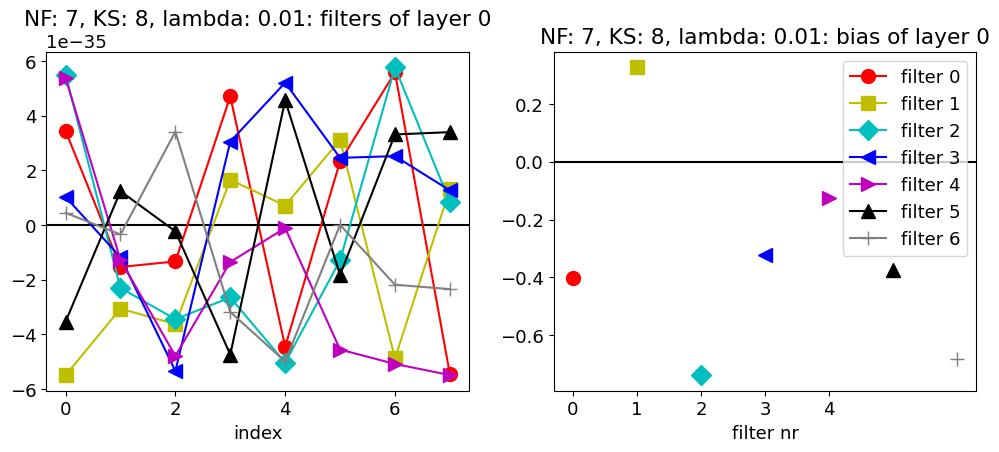

In [14]:
for nf in range(3,8):
    for ks in range(4,9):
        for lam in [0, 10**(-5), 10**(-4),10**(-3),10**(-2)]:
            my_model=build_model(NCONV=NCONV,KS=ks, NF=nf, lamb=lam)
            my_model.compile(loss=keras.losses.categorical_crossentropy,optimizer=best_opt,metrics=['accuracy'])
            my_fit=my_model.fit(x_train,y_train,batch_size=my_BATCH_SIZE,epochs=my_EPOCHS,
                            validation_data=(x_val, y_val), verbose=0, shuffle=True) 
            print(nf, ks, lam, my_fit.history['val_accuracy'][-1])
            Show_weights(my_model,0,label=f'NF: {nf}, KS: {ks}, lambda: {lam}')


### NF greater than 3 leads to more than one filter behaving very similarly, so the most efficient choice is NF=3. With KS=4, LASSO regularization and lambda=0.001 we have seen a good validation accuracy and the weights of the filters represent very clearly 3 indepenedent/complementary shapes, in which the signal can be 'decomposed': a constant trend, an raising and a descending curve.
### We obtained a similar result with Ridge regularization with lambda=0.0001.
### Similarly, with Ridge regularization, nf=3, ks=7 and lambda=0.01 we see a constant trend, a downward 'U' curve and an upward 'U'curve
### increasing the regularization parameter improves the readability of the weights but only up to a certain value of lambda.
### There is, though, quite a strong sensitivity to the intrinsic stochasticity of the algortithm.


3 4 0.001 0.6962500214576721


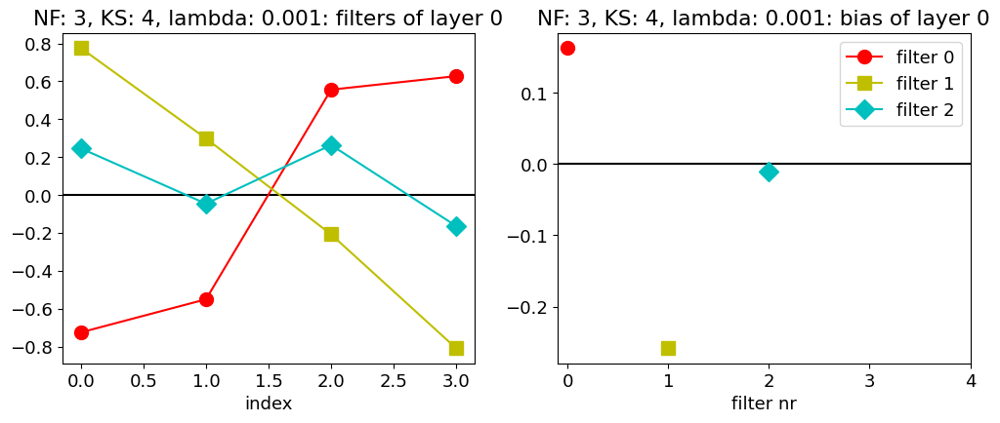

In [90]:
#snippet to check the weights of the first layer filters of a particular configuration.
best_lr=0.01
best_opt=tf.keras.optimizers.legacy.Nadam(learning_rate=best_lr)
nf,ks,lam, my_BATCH_SIZE, my_EPOCHS=3,4,0.001,200,300
my_model=build_model(NCONV=NCONV,KS=ks, NF=nf, lamb=lam, reg=keras.regularizers.l2)
my_model.compile(loss=keras.losses.categorical_crossentropy,optimizer=best_opt,metrics=['accuracy'])
my_fit=my_model.fit(x_train,y_train,batch_size=my_BATCH_SIZE,epochs=my_EPOCHS,
                validation_data=(x_val, y_val), verbose=0, shuffle=True) 
print(nf, ks, lam, my_fit.history['val_accuracy'][-1])
Show_weights(my_model,0,label=f'NF: {nf}, KS: {ks}, lambda: {lam}')
